In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score, precision_score, recall_score, jaccard_score, f1_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.autonotebook import tqdm

from sklearn.model_selection import train_test_split
import torch.nn as nn
from glob import glob
import torch
import torch.nn as nn
import torchvision
import os
import albumentations as A
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader
from albumentations.pytorch import ToTensorV2
import torchvision
from torchvision.datasets import ImageFolder
from PIL import Image
seed = 42
import torch.nn.functional as F

In [4]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f'Currently using "{device}" device.')


Currently using "cuda" device.


In [302]:
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

batch_size = 5
image_size = 448
in_channels=3
num_classes = 1
epochs = 20
threshold=0.6
path = r'seg_model.pth'

In [6]:
# from google.colab import drive
# drive.mount('/content/drive')

In [7]:
# import os
# os.environ['KAGGLE_CONFIG_DIR'] = '/content'

In [8]:
# os.getcwd()

In [9]:
# from google.colab import drive

# drive.mount('/content/gdrive/', force_remount=True)

In [10]:
# os.listdir(path_images)

In [11]:
# img=plt.imread("/kaggle/input/crack-detection-dataset/train/images/CFD_002.jpg")
# plt.imshow(img)

In [3]:
path_images = '/kaggle/input/sccdnetcorrected/train/images'
path_masks = '/kaggle/input/sccdnetcorrected/train/masks'

In [4]:
def img_mask_loading(path_images,path_masks):
    train_img_paths=[os.path.join(path_images,i) for i in os.listdir(path_images)]
    train_mask_paths=[os.path.join(path_masks,i) for i in os.listdir(path_masks)]
    train_img_paths = sorted([str(p) for p in train_img_paths])
    train_mask_paths = sorted([str(p) for p in train_mask_paths])
    return (train_img_paths,train_mask_paths)
    

In [193]:
train_img,train_mask=img_mask_loading(path_images,path_masks)
train_img[0],train_mask[0]

('/kaggle/input/sccdnetcorrected/train/images/CFD_002.jpg',
 '/kaggle/input/sccdnetcorrected/train/masks/CFD_002.jpg')

(6164, 6164)

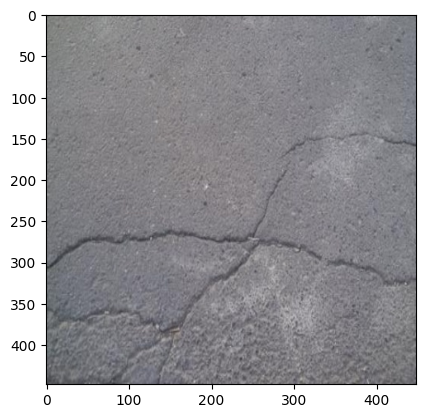

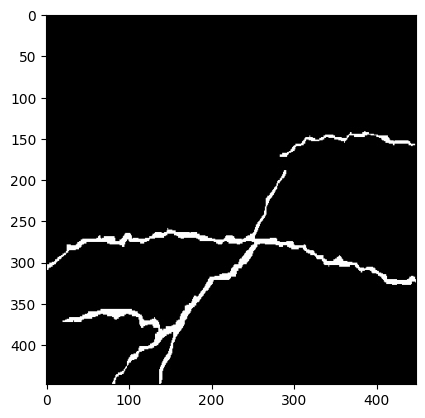

torch.Size([3, 448, 448])

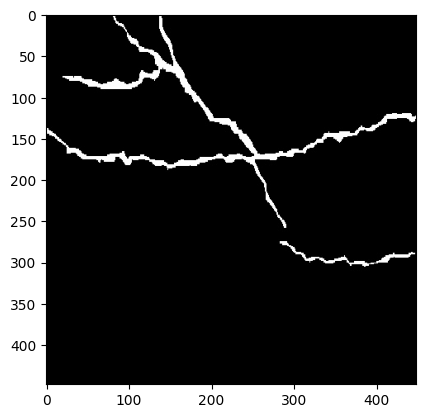

In [11]:
plt.imshow(mask2)

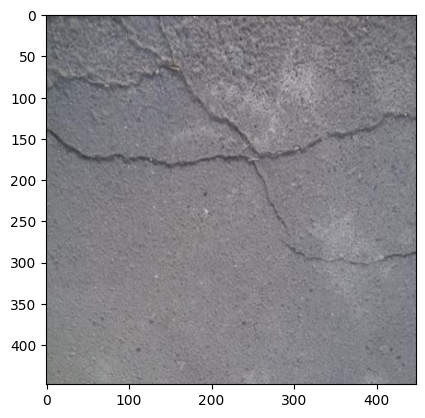

In [12]:
plt.imshow(img2)

In [13]:
# aug = A.HorizontalFlip(p=1)

In [194]:
df_train= pd.DataFrame({'images': train_img, 'masks': train_mask})

df_train.sample(2)

,images,masks
169,/kaggle/input/sccdnetcorrected/train/images/CR...,/kaggle/input/sccdnetcorrected/train/masks/CRA...
4831,/kaggle/input/sccdnetcorrected/train/images/cr...,/kaggle/input/sccdnetcorrected/train/masks/cra...


## TRansformations 

In [195]:
train_transforms = T.Compose([
    T.ToPILImage(),
    T.Resize((image_size,image_size)),
    T.ToTensor()
])

In [102]:
# transforms=train_transforms(image=img1,mask=mask1)
# img2=transforms['image']
# mask2=transforms['mask']

In [196]:
x=train_transforms(img1)

In [197]:
x.shape

torch.Size([3, 448, 448])

In [198]:
x

tensor([[[0.5294, 0.5098, 0.4863,  ..., 0.4941, 0.4824, 0.4627],
         [0.4980, 0.4863, 0.4863,  ..., 0.4863, 0.4627, 0.4392],
         [0.4706, 0.4667, 0.4745,  ..., 0.4784, 0.4471, 0.4196],
         ...,
         [0.2824, 0.2941, 0.2980,  ..., 0.4392, 0.4431, 0.4157],
         [0.2510, 0.2706, 0.2941,  ..., 0.4078, 0.3961, 0.3608],
         [0.2392, 0.2549, 0.2902,  ..., 0.3843, 0.3765, 0.3608]],

        [[0.5373, 0.5176, 0.4941,  ..., 0.5059, 0.4941, 0.4745],
         [0.5059, 0.4941, 0.4941,  ..., 0.4980, 0.4745, 0.4510],
         [0.4784, 0.4745, 0.4824,  ..., 0.4902, 0.4588, 0.4314],
         ...,
         [0.2863, 0.2980, 0.3020,  ..., 0.4353, 0.4392, 0.4118],
         [0.2549, 0.2745, 0.2980,  ..., 0.4039, 0.3922, 0.3569],
         [0.2431, 0.2588, 0.2941,  ..., 0.3804, 0.3725, 0.3569]],

        [[0.5255, 0.5059, 0.4824,  ..., 0.5255, 0.5137, 0.4941],
         [0.4941, 0.4824, 0.4824,  ..., 0.5176, 0.4941, 0.4706],
         [0.4667, 0.4627, 0.4706,  ..., 0.5098, 0.4784, 0.

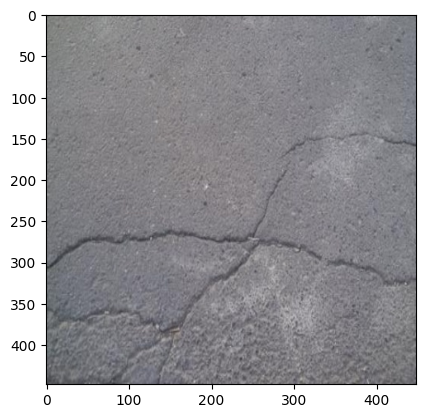

In [199]:
plt.imshow(x.permute(1,2,0))

In [200]:
train_transforms

Compose(
    ToPILImage()
    Resize(size=(448, 448), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
)

torch.Size([3, 448, 448])

### Transformations

In [33]:
# random_crop = torchvision.transforms.RandomCrop((448, 448), fill=0, padding_mode='constant')

# # Apply the transform to your image
# cropped_image = random_crop(img1_tensor)

In [34]:
# plt.imshow(cropped_image.permute(1,2,0))

In [35]:
# cropped_image.shape

In [36]:
# x=train_transforms(img1)

## Dataset Loading

In [233]:
class CrackDataset(Dataset):
    def __init__(self, dataset, transforms=None):
        self.dataset = dataset.reset_index(drop=True)
        self.transforms = transforms
        
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, ix):
        row = self.dataset.loc[ix].squeeze()
        image_path = row['images']
        mask_path = row['masks']
        
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transforms:
            image_tensor = self.transforms(image).float()
        else:
            image_tensor=T.ToPILImage()(image)
            image_tensor=T.ToTensor()((image_tensor))
            
       

        
        mask = cv2.imread(mask_path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        mask = cv2.resize(mask, (image_size, image_size))
        _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
        mask=mask/255.0
            
        mask_tensor = torch.as_tensor(mask[None], dtype=torch.float32)
        
        # mask_tensor /= 255.
        
        return image_tensor, mask_tensor
    
#     def collate_fn(self, batch):
#         images, masks = tuple(zip(*batch))
#         images = [img[None] for img in images]
#         masks = [msk[None] for msk in masks]
#         images, masks = [torch.cat(i).to(device) for i in [images, masks]]
#         return images, masks

In [234]:
# from torch.utils.data import Dataset
# from torchvision import transforms as T
# import cv2

# class CrackDataset(Dataset):
#     def __init__(self, dataset, transforms=None, image_size=(image_size,image_size)):
#         self.dataset = dataset.reset_index(drop=True)
#         self.transforms = transforms
#         self.image_size = image_size
        
#     def __len__(self):
#         return len(self.dataset)
    
#     def __getitem__(self, ix):
#         row = self.dataset.loc[ix].squeeze()
#         image_path = row['images']
#         mask_path = row['masks']
        
#         image = cv2.imread(image_path)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
#         mask = cv2.imread(mask_path)
#         mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
       
        
        
#         if self.transforms:
#             # Apply the same transformations to both image and mask
#             data = {'image': image, 'mask': mask}
#             augmented = self.transforms(image=image,mask=mask)
#             image = augmented['image']
#             mask = augmented['mask']

#         else:
#             image = T.ToPILImage()(image)
#             image = T.Resize(self.image_size)(image)
#             image = T.ToTensor()(image)
#         mask = cv2.resize(mask, (image_size, image_size))
#         _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
#         mask=mask/255.0
#         mask_tensor = torch.as_tensor(mask[None], dtype=torch.float32)

        

            
#         return image,mask
#     def collate_fn(self, batch):
#         images, masks = tuple(zip(*batch))
#         images = [img[None] for img in images]
#         masks = [msk[None] for msk in masks]
#         images, masks = [torch.cat(i).to(device) for i in [images, masks]]
#         return images, masks
            
            
       




In [235]:
# df_train['masks'][0]

In [236]:
# mask2=cv2.imread(df_train['masks'][0], cv2.IMREAD_GRAYSCALE)

In [237]:
# ((mask2>0)&(mask2<255)).sum()

In [238]:
train_dataset= CrackDataset(df_train,train_transforms)

In [239]:
train_dataset[12]

(tensor([[[0.5255, 0.4980, 0.4824,  ..., 0.2431, 0.3373, 0.4510],
          [0.5529, 0.5255, 0.4980,  ..., 0.2627, 0.3137, 0.3843],
          [0.5608, 0.5451, 0.5098,  ..., 0.2941, 0.2902, 0.3098],
          ...,
          [0.4549, 0.4196, 0.4157,  ..., 0.4941, 0.5686, 0.4706],
          [0.4078, 0.4196, 0.4275,  ..., 0.4902, 0.5725, 0.4471],
          [0.3725, 0.4196, 0.4353,  ..., 0.4745, 0.5569, 0.4118]],
 
         [[0.5333, 0.5059, 0.4902,  ..., 0.2745, 0.3686, 0.4824],
          [0.5608, 0.5333, 0.5059,  ..., 0.2941, 0.3451, 0.4157],
          [0.5686, 0.5529, 0.5176,  ..., 0.3255, 0.3216, 0.3412],
          ...,
          [0.4706, 0.4353, 0.4314,  ..., 0.5098, 0.5843, 0.4863],
          [0.4235, 0.4353, 0.4431,  ..., 0.5059, 0.5882, 0.4627],
          [0.3882, 0.4353, 0.4510,  ..., 0.4902, 0.5725, 0.4275]],
 
         [[0.5294, 0.5020, 0.4863,  ..., 0.2824, 0.3765, 0.4902],
          [0.5569, 0.5294, 0.5020,  ..., 0.3020, 0.3529, 0.4235],
          [0.5647, 0.5490, 0.5137,  ...,

In [240]:
# (train_dataset[1][1]==1.0).sum()

In [241]:
z=train_dataset[12]
z[0].shape

torch.Size([3, 448, 448])

In [242]:
((z[1]>0)&(z[1]<1)).sum()

tensor(0)

In [243]:
z[1].shape

torch.Size([1, 448, 448])

In [244]:
# z=z[0].detach().cpu().numpy()

In [245]:
# (z[1]>1).sum()

In [246]:
def show_one(image,mask):
    plt.subplot(121)
    plt.imshow(image.cpu().detach().numpy().transpose(1,2,0))
    plt.subplot(122)
    plt.imshow(mask.cpu().detach().numpy().transpose(1,2,0), cmap='gray')

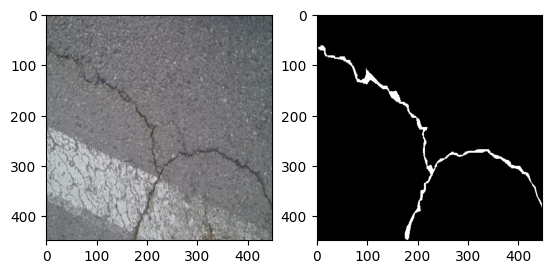

In [247]:
show_one(z[0],z[1])

## valid dataset

In [248]:
v_path_images = '/kaggle/input/sccdnetcorrected/test/images'
v_path_masks = '/kaggle/input/sccdnetcorrected/test/masks'


In [249]:
valid_img,valid_mask=img_mask_loading(v_path_images,v_path_masks)

In [250]:
valid_img[0],valid_mask[0]

('/kaggle/input/sccdnetcorrected/test/images/CFD_001.jpg',
 '/kaggle/input/sccdnetcorrected/test/masks/CFD_001.jpg')

In [251]:
df_valid= pd.DataFrame({'images': valid_img, 'masks': valid_mask})

df_valid.sample(2)

,images,masks
985,/kaggle/input/sccdnetcorrected/test/images/non...,/kaggle/input/sccdnetcorrected/test/masks/nonc...
818,/kaggle/input/sccdnetcorrected/test/images/non...,/kaggle/input/sccdnetcorrected/test/masks/nonc...


In [252]:
df_valid

,images,masks
0,/kaggle/input/sccdnetcorrected/test/images/CFD...,/kaggle/input/sccdnetcorrected/test/masks/CFD_...
1,/kaggle/input/sccdnetcorrected/test/images/CFD...,/kaggle/input/sccdnetcorrected/test/masks/CFD_...
2,/kaggle/input/sccdnetcorrected/test/images/CFD...,/kaggle/input/sccdnetcorrected/test/masks/CFD_...
3,/kaggle/input/sccdnetcorrected/test/images/CFD...,/kaggle/input/sccdnetcorrected/test/masks/CFD_...
4,/kaggle/input/sccdnetcorrected/test/images/CFD...,/kaggle/input/sccdnetcorrected/test/masks/CFD_...
...,...,...
1000,/kaggle/input/sccdnetcorrected/test/images/non...,/kaggle/input/sccdnetcorrected/test/masks/nonc...
1001,/kaggle/input/sccdnetcorrected/test/images/non...,/kaggle/input/sccdnetcorrected/test/masks/nonc...
1002,/kaggle/input/sccdnetcorrected/test/images/non...,/kaggle/input/sccdnetcorrected/test/masks/nonc...
1003,/kaggle/input/sccdnetcorrected/test/images/non...,/kaggle/input/sccdnetcorrected/test/masks/nonc...


### Valid loader

In [253]:
valid_dataset = CrackDataset(df_valid)

In [254]:
v1=valid_dataset[0]

In [255]:
v1

(tensor([[[0.4706, 0.4157, 0.3765,  ..., 0.4863, 0.4902, 0.4863],
          [0.4471, 0.4078, 0.3882,  ..., 0.4745, 0.4824, 0.4902],
          [0.4275, 0.4078, 0.4118,  ..., 0.4706, 0.4784, 0.5098],
          ...,
          [0.3843, 0.4157, 0.4392,  ..., 0.4588, 0.4745, 0.4588],
          [0.4078, 0.4275, 0.4314,  ..., 0.4863, 0.4863, 0.4431],
          [0.4039, 0.4196, 0.4118,  ..., 0.5098, 0.4980, 0.4392]],
 
         [[0.4902, 0.4353, 0.3961,  ..., 0.5020, 0.5059, 0.5020],
          [0.4667, 0.4275, 0.4078,  ..., 0.4902, 0.4980, 0.5059],
          [0.4471, 0.4275, 0.4314,  ..., 0.4863, 0.4941, 0.5255],
          ...,
          [0.3922, 0.4235, 0.4471,  ..., 0.4745, 0.4902, 0.4745],
          [0.4157, 0.4353, 0.4392,  ..., 0.5020, 0.5020, 0.4588],
          [0.4118, 0.4275, 0.4196,  ..., 0.5255, 0.5137, 0.4549]],
 
         [[0.4745, 0.4196, 0.3804,  ..., 0.5059, 0.5098, 0.5059],
          [0.4510, 0.4118, 0.3922,  ..., 0.4941, 0.5020, 0.5098],
          [0.4314, 0.4118, 0.4157,  ...,

In [256]:
# ((z[1]>0)&(z[1]<1)).sum()

In [257]:
((v1[1]>0)&(v1[1]<1.0)).sum()

tensor(0)

In [258]:
v1[1].dtype

torch.float32

tensor(0)

Index:  454


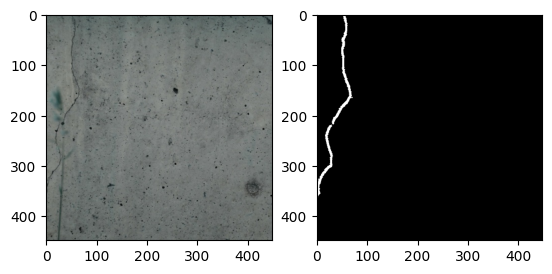

In [259]:
x=np.random.randint(0, len(df_valid))
print("Index: ",x)
plt.subplot(121)
plt.imshow(valid_dataset[x][0].cpu().detach().numpy().transpose(1,2,0))
plt.subplot(122)
plt.imshow(valid_dataset[x][1].cpu().detach().numpy().transpose(1,2,0), cmap='gray')

**Data Loaders **

In [261]:
train_dataloader=DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, drop_last=True)

In [262]:
for i in train_dataloader:
    print((i[0][0]>1).sum())
    print(((i[1]>0)&(i[1]<1.0)).sum())
    print(i[0].shape)
    print(i[1].shape)
    break

tensor(0)
tensor(0)
torch.Size([5, 3, 448, 448])
torch.Size([5, 1, 448, 448])


In [263]:
for i in valid_dataloader:
    print((i[0][0]>1).sum())
    print(((i[1]>0)&(i[1]<1.0)).sum())
    print(i[0].shape)
    print(i[1].shape)
    break

tensor(0)
tensor(0)
torch.Size([5, 3, 448, 448])
torch.Size([5, 1, 448, 448])


## model building

### Unet

In [264]:
import torchvision.transforms.functional as TF

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

class UNET(nn.Module):
    def __init__(
            self, in_channels=3, out_channels=1, features=[64, 128, 256, 512],
    ):
        super(UNET, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.inp_channels=in_channels

        # Down part of UNET
        
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature

        # Up part of UNET
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(
                    feature*2, feature, kernel_size=2, stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature))

        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)
        

    def forward(self, x):
        skip_connections = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]

        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]

            if x.shape != skip_connection.shape:
                x = TF.resize(x, size=skip_connection.shape[2:])

            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)
        x=self.final_conv(x)
        
        return x


x = torch.randn((3, 3, 161, 161))
model = UNET(in_channels=3, out_channels=1)
preds = model(x)
model.to(device)
preds.shape
# assert preds.shape == x.shape

torch.Size([3, 1, 161, 161])

In [ ]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = YourModel().to(device)  # Replace YourModel with your actual model
# input_tensor = torch.randn(batch_size, 3, 448, 448).to(device)
# 

In [ ]:
# out_tensor = torch.randint(0, 2, (batch_size, 1, 448, 448), device=device)


In [ ]:
# input_tensor.shape

In [ ]:
# max_memory_allocated = torch.cuda.max_memory_allocated(device)
# current_memory_allocated = torch.cuda.memory_allocated(device)

# print(f"Maximum GPU memory allocated: {max_memory_allocated / (1024 * 1024):.2f} MB")
# print(f"Current GPU memory allocated: {current_memory_allocated / (1024 * 1024):.2f} MB")


In [ ]:
# Ensure that all caches are empty (not necessary but can provide a more accurate measurement)
# torch.cuda.empty_cache()

# # Perform a forward pass to allocate memory
# output_tensor = model(input_tensor)


# # Measure GPU memory usage
# max_memory_allocated = torch.cuda.max_memory_allocated(device)
# current_memory_allocated = torch.cuda.memory_allocated(device)

# print(f"Maximum GPU memory allocated: {max_memory_allocated / (1024 * 1024):.2f} MB")
# print(f"Current GPU memory allocated: {current_memory_allocated / (1024 * 1024):.2f} MB")


In [ ]:
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # if unfreeze=True -> 1e-4, 1e-5, so not to ruin good init w
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
# # early = EarlyStopping()


# # Loss function and optimizer
# criterion = nn.BCEWithLogitsLoss()
# loss = criterion(output_tensor, output_tensor)
# loss.backward()
# optimizer.step()

### Deep Lab v3

In [ ]:
from torchvision.models.segmentation.deeplabv3 import DeepLabHead

def get_model(output_channels=1, unfreeze=True):
    model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True, progress=False)
    
    for param in model.parameters():
        param.requires_grad = unfreeze
    
    model.classifier = DeepLabHead(2048, output_channels)
    
    return model.to(device)

# model = UNET(3,1)  # set output_channels = 3 if we work with colored masks

In [ ]:
# model=get_model(1,True)

In [265]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, path=path):
        self.path = path
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = np.inf
        self.early_stop = False
        
    def __call__(self, val_loss, model=None):
        if self.best_loss - val_loss > self.min_delta:
            torch.save(model.state_dict(), self.path)
            print(f'Model saved to: {self.path}')
            self.best_loss = val_loss
            self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

In [146]:
# test_transforms=T.Compose([
#     T.ToPILImage(),
#       # Apply augmentation transforms with a 50% probability
#     T.Resize((image_size,image_size)),
#     T.ToTensor(),
# ])

In [266]:
test_transforms=train_transforms

In [267]:
test_transforms

Compose(
    ToPILImage()
    Resize(size=(448, 448), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
)

In [290]:
@torch.no_grad()
def validate_test_image(model, dataset,n=None):
    if n:
        idx=n
    else:
        idx = np.random.randint(len(dataset))

    dataset = dataset.reset_index(drop=True)
    row = dataset.loc[idx].squeeze()
    
    image = cv2.imread(row['images'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_tensor = test_transforms(image).unsqueeze(0).to(device)
    
    mask = cv2.imread(row['masks'])
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    mask = cv2.resize(mask, (image_size, image_size))
    _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    
#     print((mask==255).sum())

    mask=np.expand_dims(mask, axis=-1)

    
    
    
    print("shape of image",image_tensor.shape,"mask.shape",mask.shape)
#     model.eval()
    output = model(image_tensor)
    output=output.squeeze(0)
    
    output=torch.sigmoid(output)
#     print(output)
    output=output.detach().cpu()
    output=(output > threshold).float()
    
#     print(((output>0.0) & (output<1.0)).sum())
    output=output.numpy().transpose(1,2,0)
    

  
    
    plt.figure(figsize=(8, 4))
    plt.subplot(131)
    plt.title('Original image')
    plt.imshow(image)
    
    plt.subplot(132)
    plt.title('Original mask')
    plt.imshow(mask, cmap='gray')
    
    plt.subplot(133)
    plt.title('Predicted mask')
    plt.imshow(output,cmap="gray")
    
#     print(output)
    
    plt.tight_layout()
    plt.show()
    plt.pause(0.001)

shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


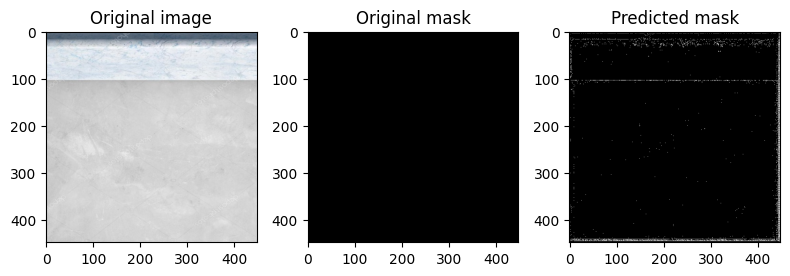

In [291]:
validate_test_image(model, df_valid)

In [ ]:
# def train_one_batch(batch, model, criterion, optimizer):
#     images, masks = batch
#     optimizer.zero_grad()
#     plt.imshow(image)
    
#     plt.subplot(132)
#     plt.title('Original mask')
#     plt.imshow(mask, cmap='gray')
    
#     plt.subplot(133)
#     plt.title('Predicted mask')
#     plt.imshow(output, cmap='gray')
# #     print(output)
    
#     plt.tight_layout()
#     plt.show()
#     output = model(images)
#     loss = criterion(output, masks,reduction='mean',alpha=0.7,gamma=1.5)
#     loss.backward()
#     optimizer.step()
#     dice_loss=None
#     with torch.no_grad():
#         dice_loss=dice_coefficient(output,masks)
#     return loss.item(),dice_loss
# @torch.no_grad()

# def validate_one_batch(batch, model, criterion):
#     images, masks = batch
#     output = model(images)
#     dice_loss=None
#     with torch.no_grad():
#         dice_loss=dice_coefficient(output,masks)
#     loss =criterion(output, masks,reduction='mean',alpha=0.25,gamma=1.5)
# #     loss=criterion(output,masks)
#     return loss.item(),dice_loss

In [ ]:
# def dice(y_true, y_pred):
#     return (2 * (y_true * y_pred).sum() + 1e-15) / (y_true.sum() + y_pred.sum() + 1e-15)

# def iou(y_true, y_pred):
#     intersection = (y_true * y_pred).sum()
#     union = y_true.sum() + y_pred.sum() - intersection
#     return (intersection + 1e-15) / (union + 1e-15)

# def precision(y_true, y_pred):
#     TP = (y_true * y_pred).sum()
#     FP = ((1-y_true)*y_pred).sum()
#     return (TP + 1e-15) / (TP + FP + 1e-15)

# def recall(y_true, y_pred):
#     TP = (y_true * y_pred).sum()
#     FN = (y_true*(1 - y_pred)).sum()
#     return (TP + 1e-15) / (TP + FN + 1e-15)

In [294]:
def precision_tensor(y_true, y_pred):
    # Calculate True Positives (TP)
    TP = torch.sum(y_true * y_pred)

    # Calculate False Positives (FP)
    FP = torch.sum((1 - y_true) * y_pred)

    # Compute precision
    epsilon = 1e-15  # Small value to avoid division by zero
    precision_value = (TP ) / (TP + FP + epsilon)

    return precision_value

In [295]:
def recall_tensor(y_true, y_pred):
    # Calculate True Positives (TP)
    TP = torch.sum(y_true * y_pred)

    # Calculate False Negatives (FN)
    FN = torch.sum(y_true * (1 - y_pred))

    # Compute recall
    epsilon = 1e-15  # Small value to avoid division by zero
    recall_value = (TP ) / (TP + FN + epsilon)

    return recall_value

In [296]:
test=train_dataset[2]
test[0].shape
    

torch.Size([3, 448, 448])

In [297]:
# train_img=test[0].unsqueeze(0)

In [298]:
inp=test[0].unsqueeze(0)
inp.shape

torch.Size([1, 3, 448, 448])

In [299]:
# with torch.no_grad():
#     output=model(inp)

In [300]:
# import torch.nn.functional as F
# out_sig=F.sigmoid(output)

In [301]:
# output

In [178]:
# output.shape

In [179]:
# output=output.numpy().transpose(1,2,0)

In [180]:
# output

In [181]:
# threshold_value = 0.6
# max_value = 1
# _, out_tr = cv2.threshold(output, threshold_value, max_value, cv2.THRESH_BINARY)

In [182]:
# y_pred=np.expand_dims(y_pred,axis=-1)

In [183]:
# output=output[0].cpu().detach().numpy().transpose(1,2,0)

In [184]:
# output.shape

In [185]:
# t_mask.shape

In [186]:
# t_mask.shape

In [187]:
# t_mask=t_mask[0].cpu().detach().numpy().transpose(1,2,0)

## Training 

In [ ]:
# train_losses, valid_losses = [], []

# dice_loss_train,dice_loss_valid=[],[]
# for epoch in range(epochs):

#     print(f'Epoch {epoch + 1}/{epochs}')
#     epoch_train_losses, epoch_valid_losses = [], []
#     t_d,v_d=None,None
#     model.train()
#     for _, batch in enumerate(tqdm(train_dataloader, leave=False)):
#         batch_train_loss,t_d = train_one_batch(batch, model, criterion, optimizer)
#         epoch_train_losses.append(batch_train_loss)
#     epoch_train_loss = np.array(epoch_train_losses).mean()
#     train_losses.append(epoch_train_loss)
#     dice_loss_train.append(t_d)
#     print(f'Train loss: {epoch_train_loss:.4f}.')
#     print(f'Dice loss: {t_d:.4f}.')
    
#     model.eval()
#     for i, batch in enumerate(tqdm(valid_dataloader, leave=False)):
#         batch_valid_loss,v_d= validate_one_batch(batch, model, criterion)
#         epoch_valid_losses.append(batch_valid_loss)
#     epoch_valid_loss = np.array(epoch_valid_losses).mean()
#     valid_losses.append(epoch_valid_loss)
#     print(f'Valid loss: {epoch_valid_loss:.4f}.')
#     print(f'Dice loss: {v_d:.4f}.')
#     print('-'*50)    
    
#     validate_test_image(model, test)
    
#     scheduler.step(epoch_valid_loss)
#     early(epoch_valid_loss, model=model)
#     if early.early_stop:
#         print(f'Validation loss did not improve for {early.patience} epochs. Training stopped.')
#         model.load_state_dict(torch.load(path))
#         break
    

In [ ]:
# model=model.to(device)
# # criterion= torchvision.ops.sigmoid_focal_loss
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # if unfreeze=True -> 1e-4, 1e-5, so not to ruin good init w
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
# early = EarlyStopping()


# # Loss function and optimizer
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=your_learning_rate)

# Define a function to evaluate the model

# Training loop
# num_epochs = your_num_epochs
# train_metrics = {'accuracy': [], 'precision': [], 'recall': [], 'iou_score': [], 'dice_score': []}
# val_metrics = {'accuracy': [], 'precision': [], 'recall': [], 'iou_score': [], 'dice_score': []}

# for epoch in range(num_epochs):
#     model.train()
#     running_loss = 0.0
    
#     for inputs, targets in train_loader:
#         inputs = inputs.to(device)
#         targets = targets.to(device)

#         optimizer.zero_grad()
#         outputs = model(inputs)
#         loss = criterion(outputs, targets)
#         loss.backward()
#         optimizer.step()
        
#         running_loss += loss.item()
        

#     # Calculate training metrics
#     accuracy, precision, recall, iou_score, dice_score = evaluate_segmentation_model(train_loader, model)
#     train_metrics['accuracy'].append(accuracy)
#     train_metrics['precision'].append(precision)
#     train_metrics['recall'].append(recall)
#     train_metrics['iou_score'].append(iou_score)
#     train_metrics['dice_score'].append(dice_score)

#     # Calculate validation metrics
#     accuracy, precision, recall, iou_score, dice_score = evaluate_segmentation_model(val_loader, model)
#     val_metrics['accuracy'].append(accuracy)
#     val_metrics['precision'].append(precision)
#     val_metrics['recall'].append(recall)
#     val_metrics['iou_score'].append(iou_score)
#     val_metrics['dice_score'].append(dice_score)

#     print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {running_loss / len(train_loader)}")

# After training, you can access the training and validation metrics in the 'train_metrics' and 'val_metrics' dictionaries.


In [ ]:


# def find_metrics(outputs, masks, threshold=0.6):
#     dice_scores = []
#     iou_scores = []
#     precision_scores = []
#     recall_scores = []
#     f1_scores = []
#     outputs=torch.sigmoid(outputs)
#     for i in range(batch_size):
#         with torch.no_grad():
            
#             y_pred = (outputs[i] > threshold).float()

#             intersection = torch.logical_and(y_pred, masks[i])
#             union = torch.logical_or(y_pred, masks[i])

# #             iou = torch.sum(intersection) / (torch.sum(union) + 1e-15)
# #             dice = 2 * torch.sum(intersection) / (torch.sum(y_pred) + torch.sum(masks[i]) + 1e-15)
            
#             iou1= (torch.sum(intersection)+1e-15) / (torch.sum(union) + 1e-15)
#             dice1 = (2 * torch.sum(intersection)+1e-15)/ (torch.sum(y_pred) + torch.sum(masks) + 1e-15)
#             # precision1 = (torch.sum(intersection)+1e-15) / (torch.sum(y_pred) + 1e-15)
#             # recall1 = (torch.sum(intersection)+1e-5) / (torch.sum(masks) + 1e-15)
#             precision1=precision_tensor(y_pred,masks)
#             recall1=recall_tensor(y_pred,masks)
#             f11 = (2 * precision1* recall1) / (precision1 + recall1)

#             dice_scores.append(dice1)
#             iou_scores.append(iou1)
#             precision_scores.append(precision1)
#             recall_scores.append(recall1)
#             f1_scores.append(f11)
    
# #     print(z1)
#     return {
#         'dice': torch.mean(torch.tensor(dice_scores, device=outputs.device)),
#         'iou': torch.mean(torch.tensor(iou_scores, device=outputs.device)),
#         'precision': torch.mean(torch.tensor(precision_scores, device=outputs.device)),
#         'recall': torch.mean(torch.tensor(recall_scores, device=outputs.device)),
#         'f1_score': torch.mean(torch.tensor(f1_scores, device=outputs.device))
#     }
            
            

In [303]:
def find_metrics(outputs, masks, threshold=threshold):
    dice_scores = []
    iou_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    outputs = torch.sigmoid(outputs)
    for i in range(batch_size):
        with torch.no_grad():
            y_pred = (outputs[i] > threshold).float()
            intersection = torch.logical_and(y_pred, masks[i])
            union = torch.logical_or(y_pred, masks[i])

            iou1 = (torch.sum(intersection) + 1e-15) / (torch.sum(union) + 1e-15)
            dice1 = (2 * torch.sum(intersection) + 1e-15) / (torch.sum(y_pred) + torch.sum(masks[i]) + 1e-15)
            
            precision1 = precision_tensor(y_pred, masks[i])
            recall1 = recall_tensor(y_pred, masks[i])
            f11 = (2 * precision1 * recall1) / (precision1 + recall1)

            dice_scores.append(dice1)
            iou_scores.append(iou1)
            precision_scores.append(precision1)
            recall_scores.append(recall1)
            f1_scores.append(f11)

    return {
        'dice': torch.mean(torch.tensor(dice_scores, device='cpu')),
        'iou': torch.mean(torch.tensor(iou_scores, device='cpu')),
        'precision': torch.mean(torch.tensor(precision_scores, device='cpu')),
        'recall': torch.mean(torch.tensor(recall_scores, device='cpu')),
        'f1_score': torch.mean(torch.tensor(f1_scores, device='cpu'))
    }


In [190]:
# torch.cuda.empty_cache()

In [196]:
model

UNET(
  (ups): ModuleList(
    (0): ConvTranspose2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
    (1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (2): ConvTranspose2d(512, 256, kernel_size=(2, 2), stride=(2, 2))
    (3): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), p

Epoch 1/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.05114954258874059
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


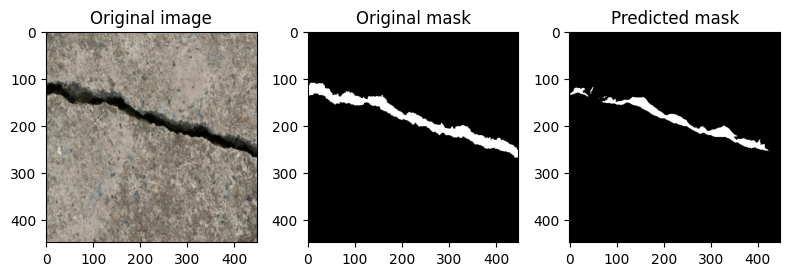

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


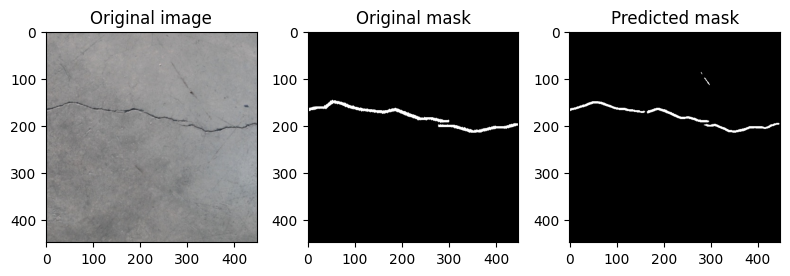

train_data visualize: loss:  0.03681122190132737
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


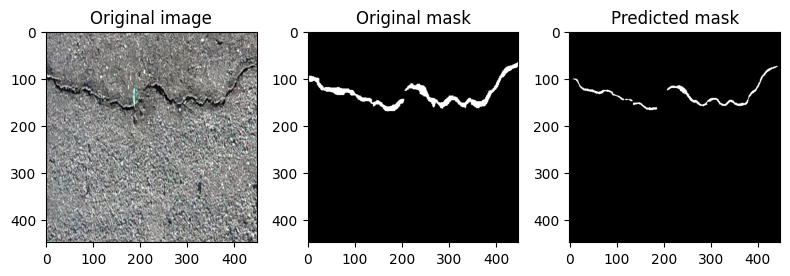

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


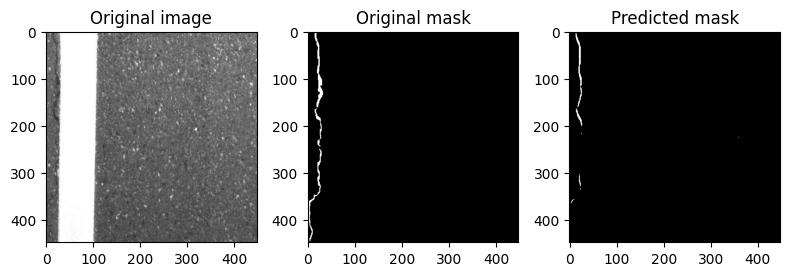

training_loss: 0.04221
training_iou: 0.40490
training_dice: 0.51557
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


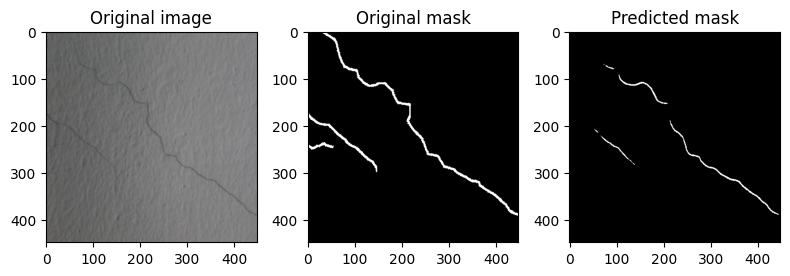

Epoch 2/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.03178470308892429
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


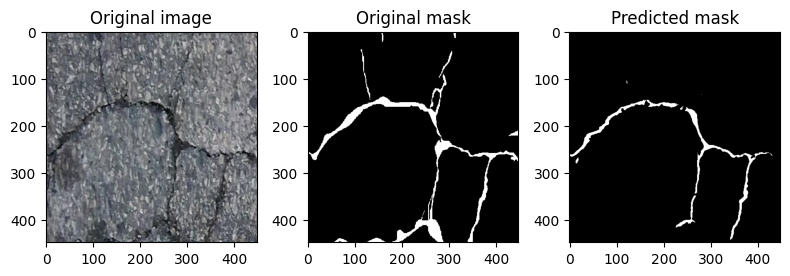

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


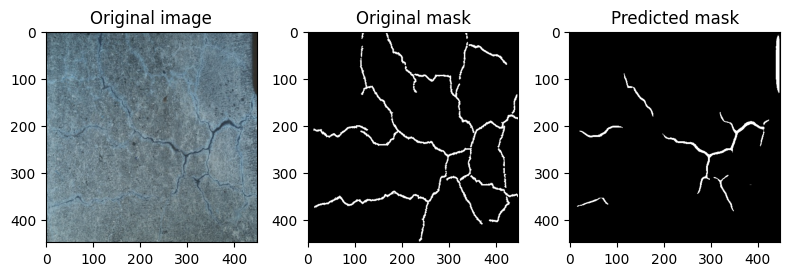

train_data visualize: loss:  0.028905983451753856
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


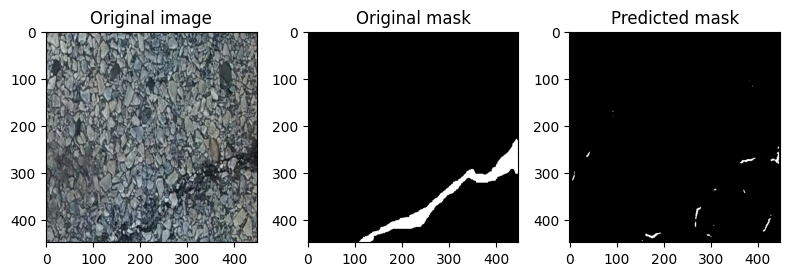

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


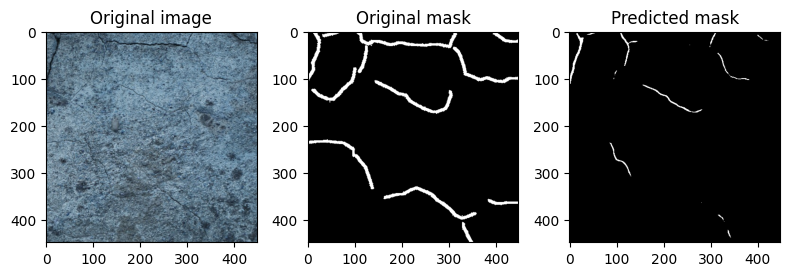

training_loss: 0.02992
training_iou: 0.48183
training_dice: 0.59731
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


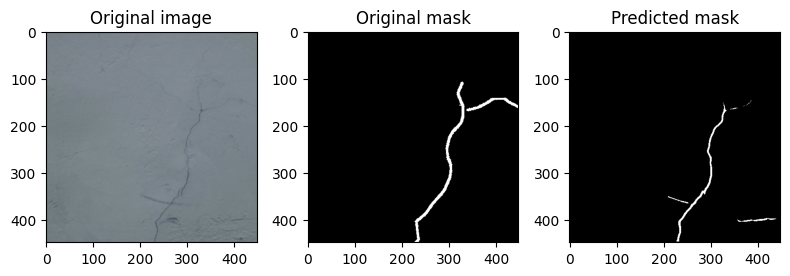

Epoch 3/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.028201306875795126
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


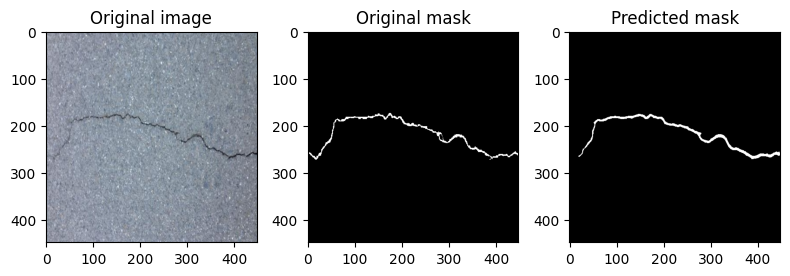

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


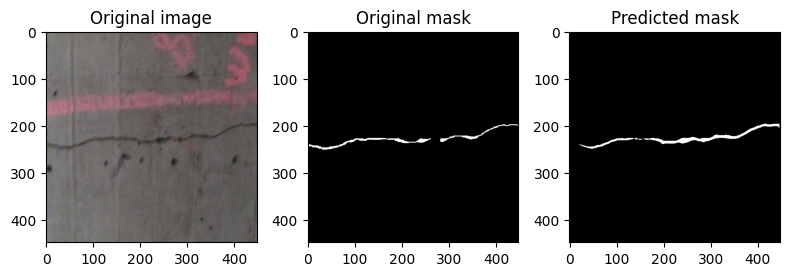

train_data visualize: loss:  0.025863274252042174
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


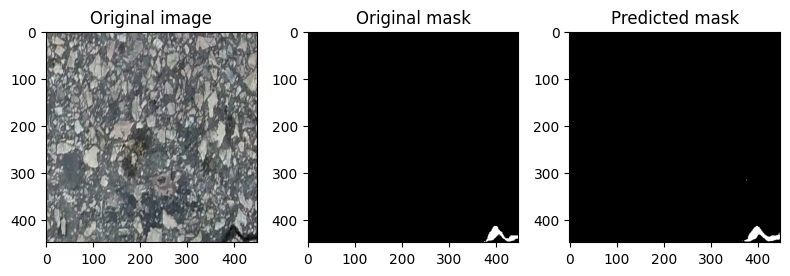

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


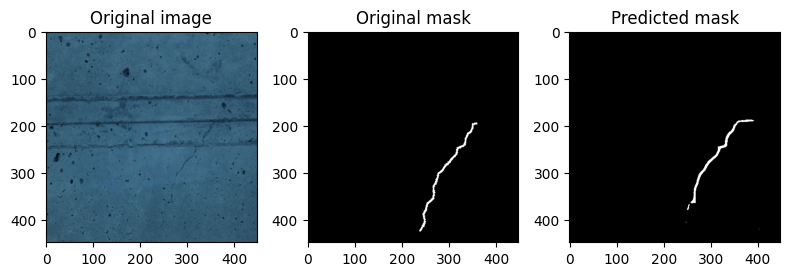

training_loss: 0.02667
training_iou: 0.51186
training_dice: 0.62658
Validation loss: 0.0276
Validation iou: 0.4717
Validation dice: 0.5811
Model saved to: seg_model.pth
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


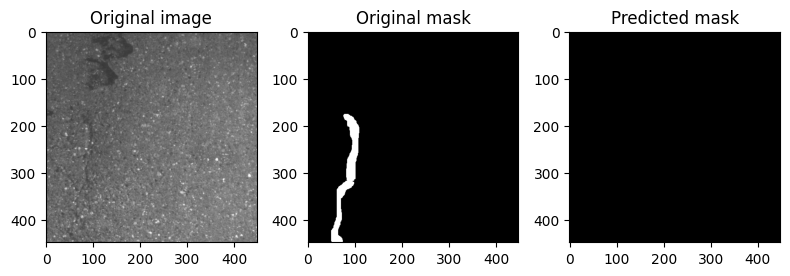

Model saved after 3 epochs to seg_model_3.pth
Epoch 4/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.02552236806973815
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


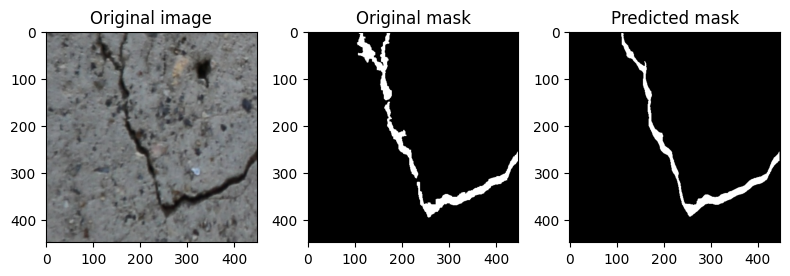

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


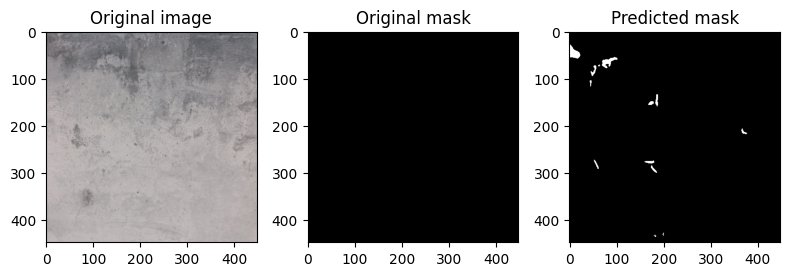

train_data visualize: loss:  0.02552925060875714
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


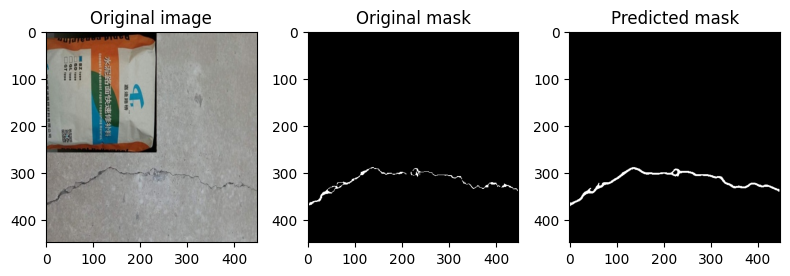

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


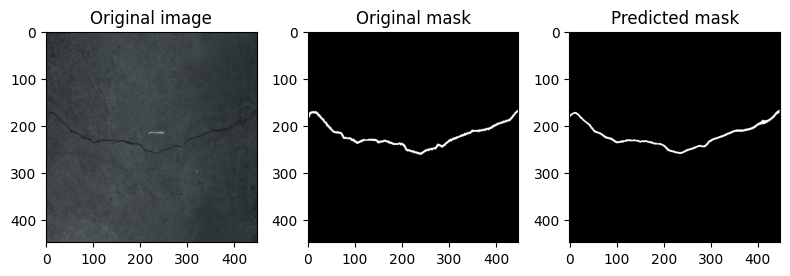

training_loss: 0.02543
training_iou: 0.51393
training_dice: 0.63307
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


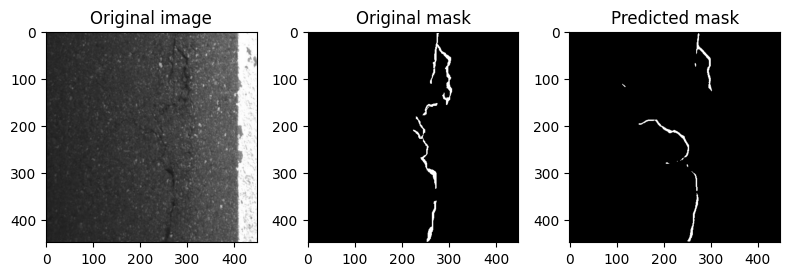

Epoch 5/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.024201335556805134
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


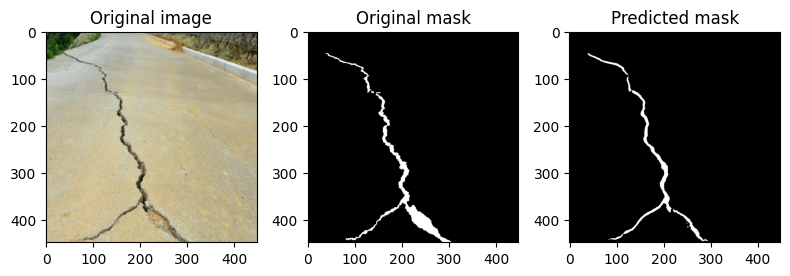

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


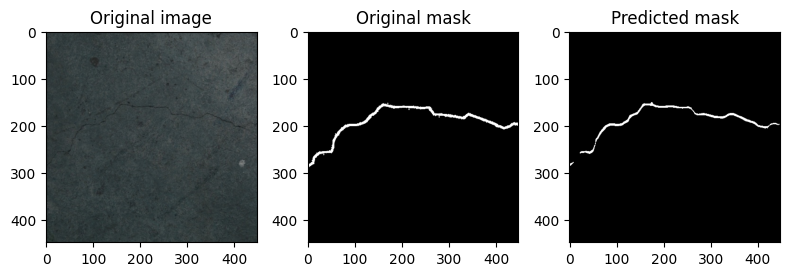

train_data visualize: loss:  0.024669367886148392
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


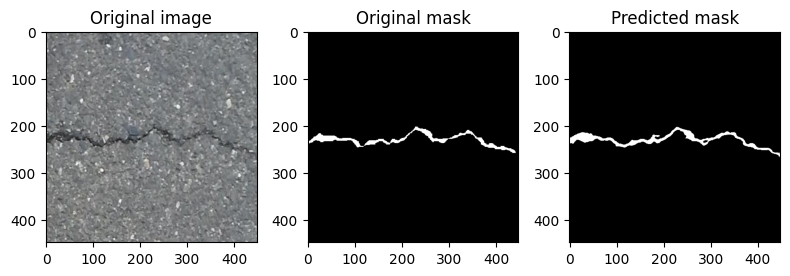

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


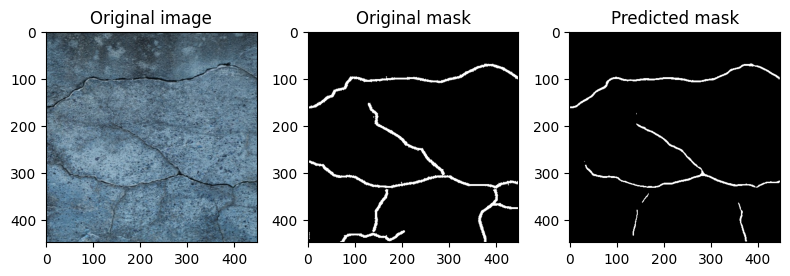

training_loss: 0.02436
training_iou: 0.53253
training_dice: 0.64752
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


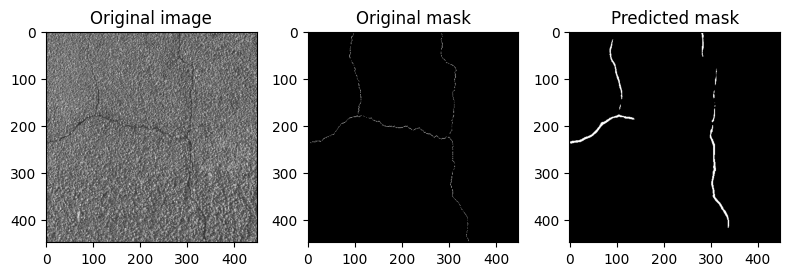

Epoch 6/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.023682587733492255
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


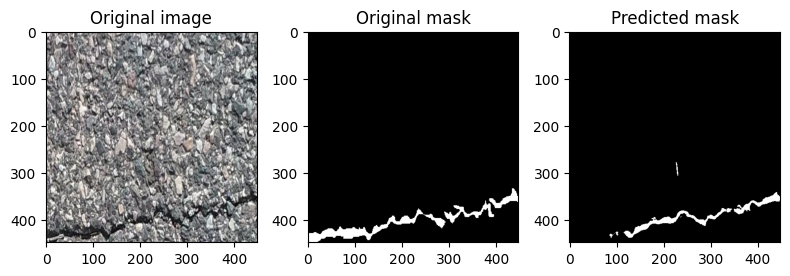

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


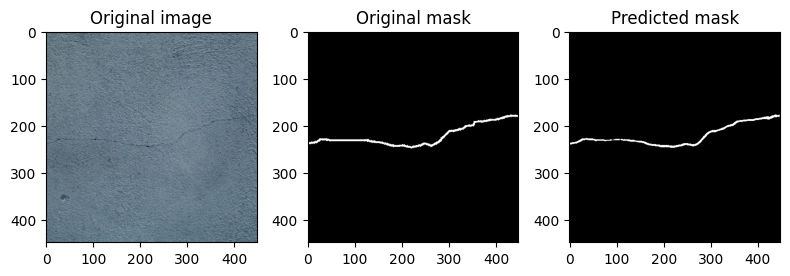

train_data visualize: loss:  0.022532142338342966
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


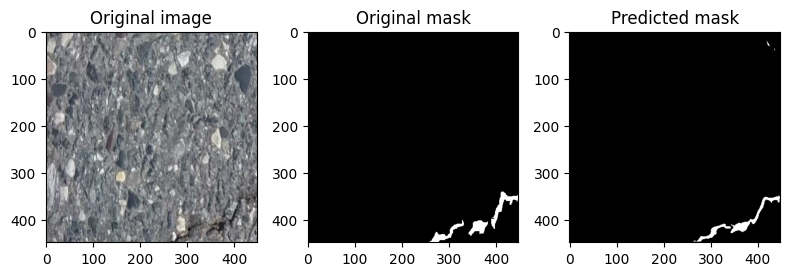

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


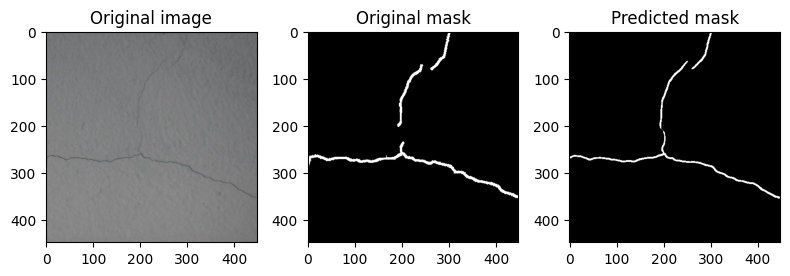

training_loss: 0.02287
training_iou: 0.54492
training_dice: 0.66066
Validation loss: 0.0222
Validation iou: 0.5621
Validation dice: 0.6747
Model saved to: seg_model.pth
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


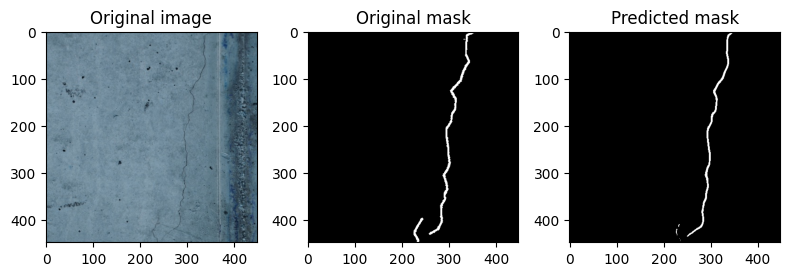

Epoch 7/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.023476482421159746
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


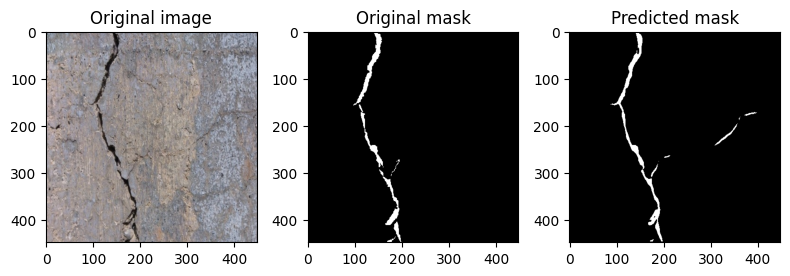

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


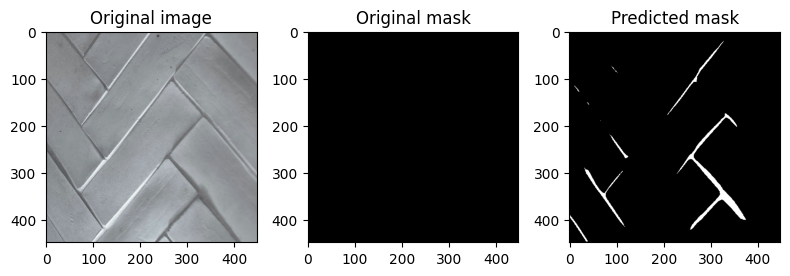

train_data visualize: loss:  0.021997574066743256
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


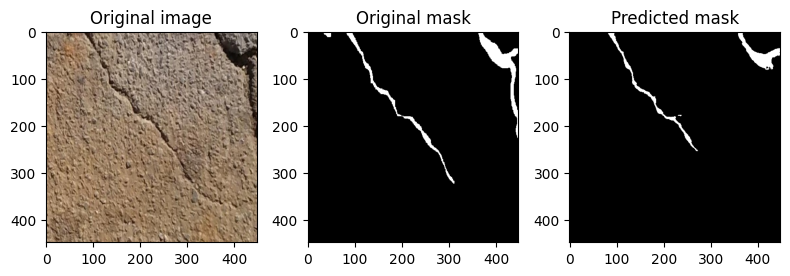

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


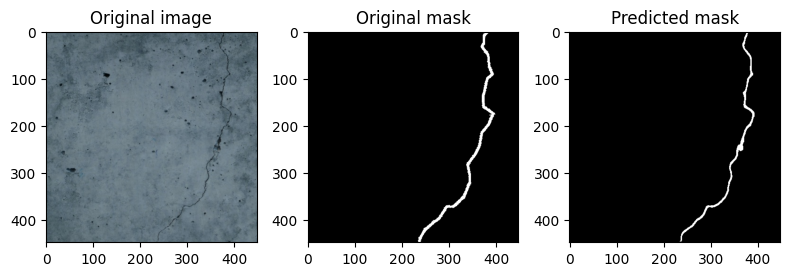

training_loss: 0.02282
training_iou: 0.54050
training_dice: 0.65680
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


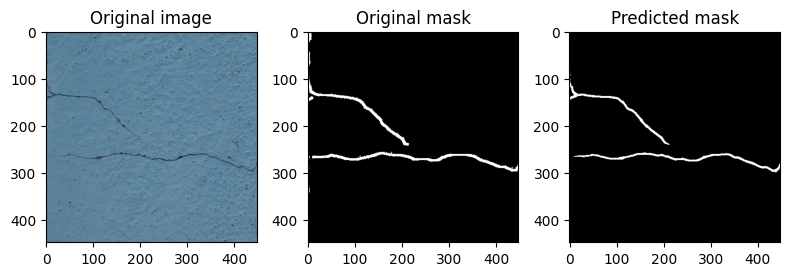

Epoch 8/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.021379935530014337
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


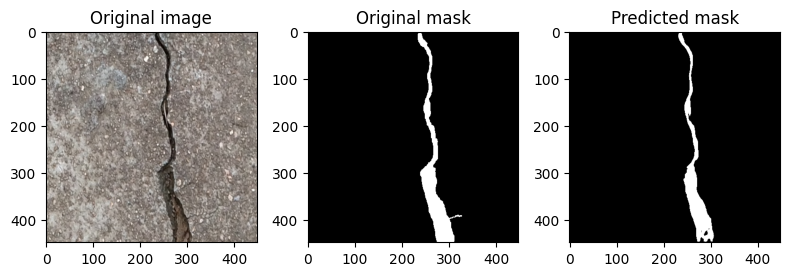

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


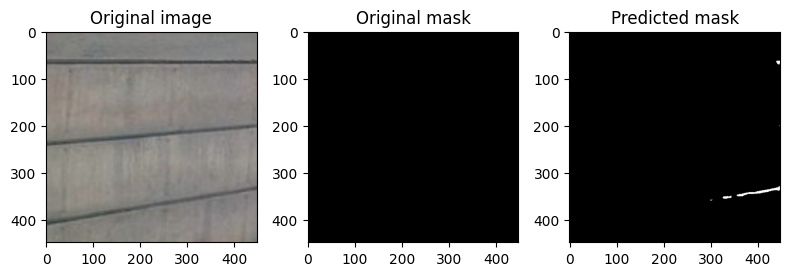

train_data visualize: loss:  0.021871963191777467
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


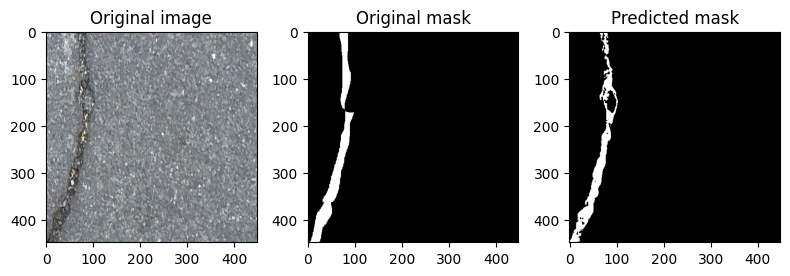

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


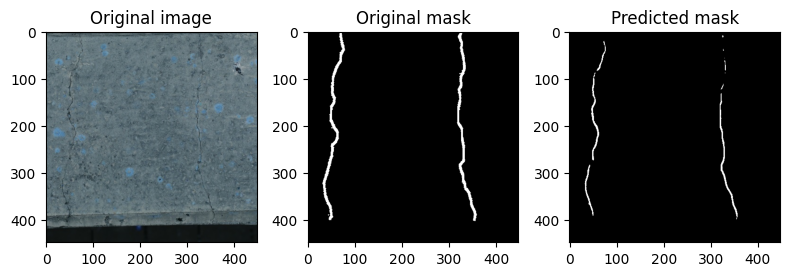

training_loss: 0.02182
training_iou: 0.54456
training_dice: 0.66267
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


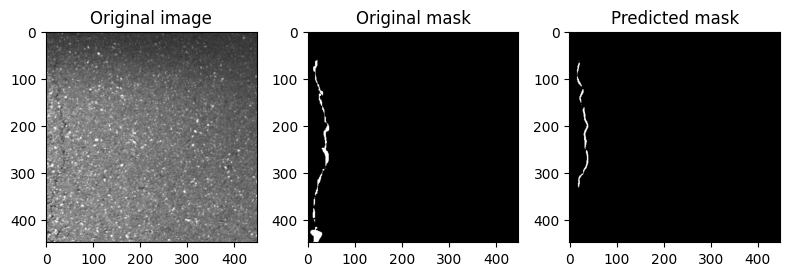

Epoch 9/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.020883871181868015
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


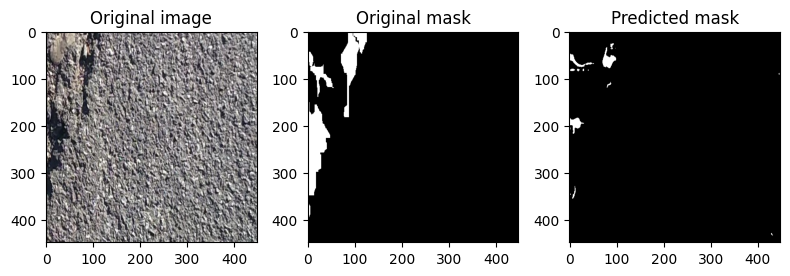

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


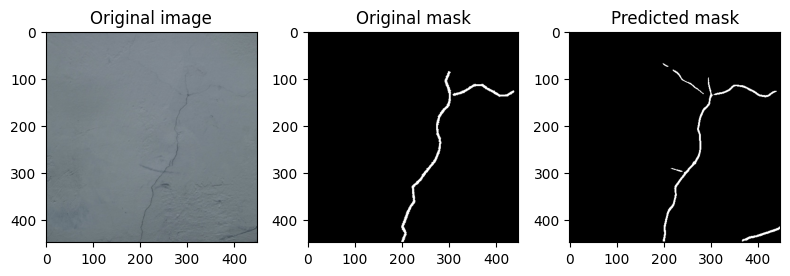

train_data visualize: loss:  0.021898203632794322
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


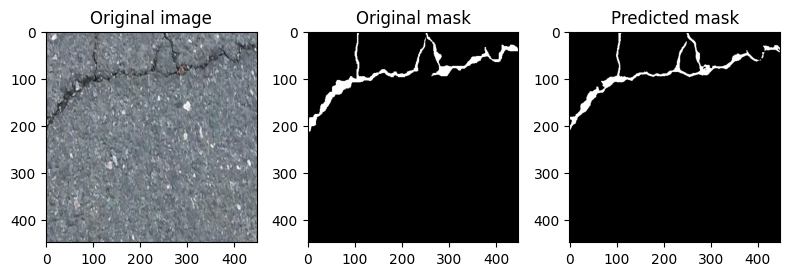

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


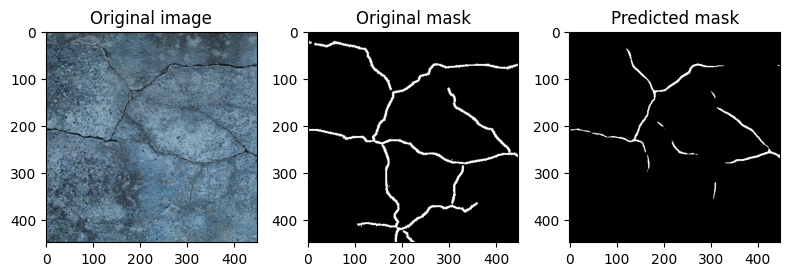

training_loss: 0.02117
training_iou: 0.57059
training_dice: 0.68721
Validation loss: 0.0199
Validation iou: 0.5682
Validation dice: 0.6772
Model saved to: seg_model.pth
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


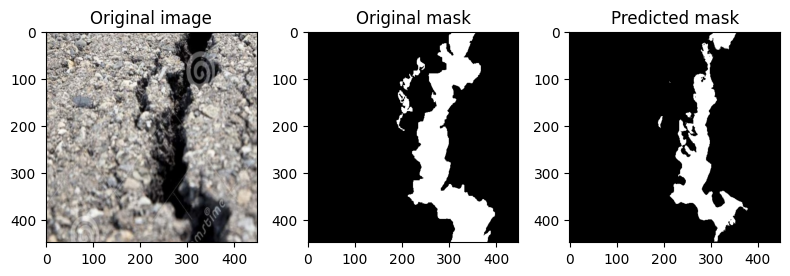

Epoch 10/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.01970400340575725
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


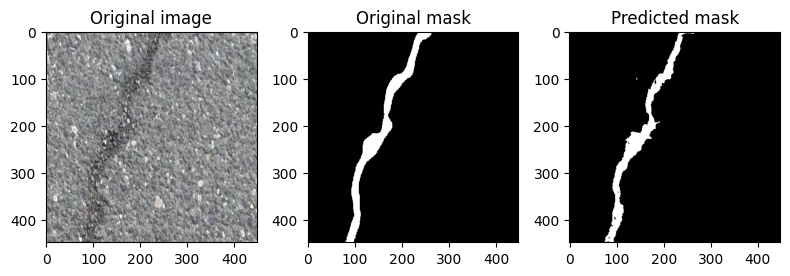

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


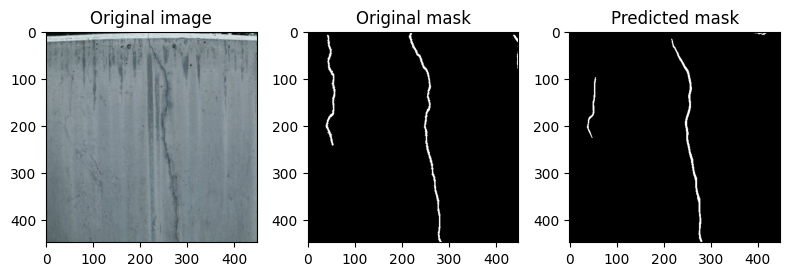

train_data visualize: loss:  0.02053597713727504
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


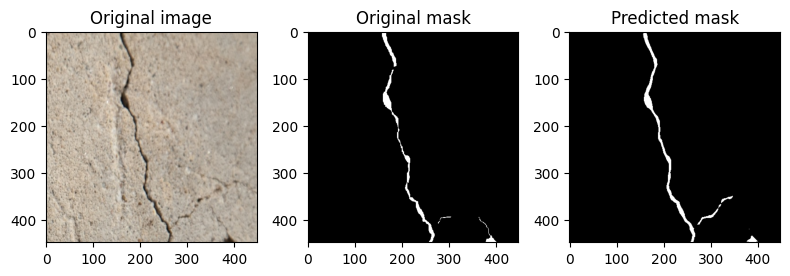

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


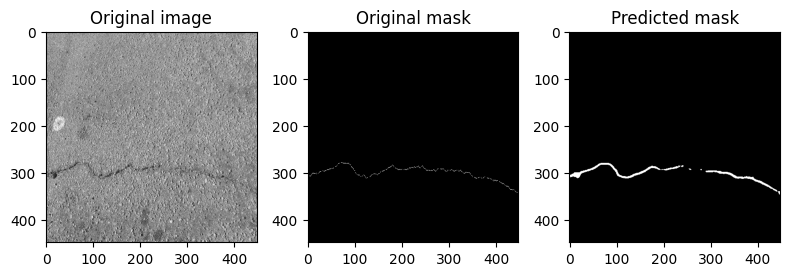

training_loss: 0.02055
training_iou: 0.57374
training_dice: 0.69220
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


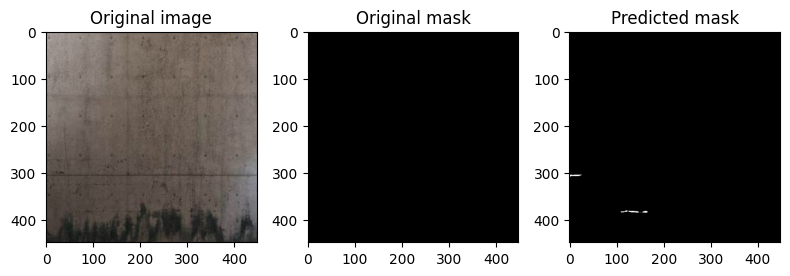

Epoch 11/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.019955700734630228
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


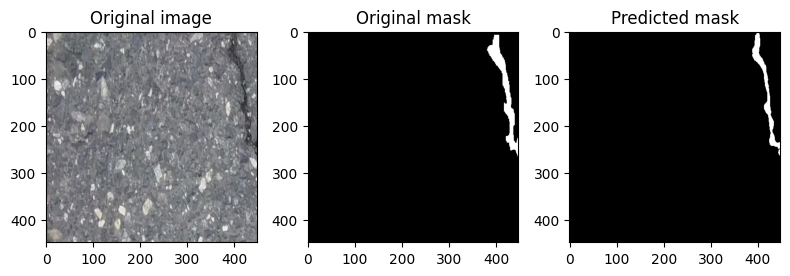

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


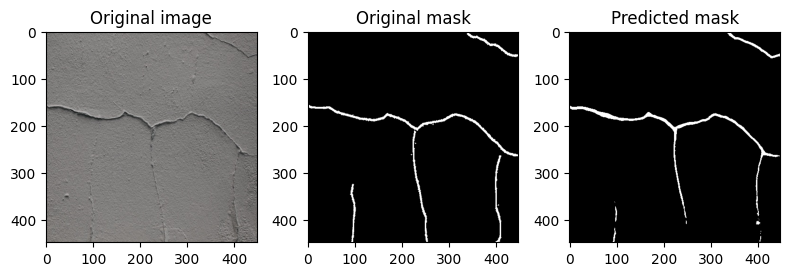

train_data visualize: loss:  0.020233713513240218
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


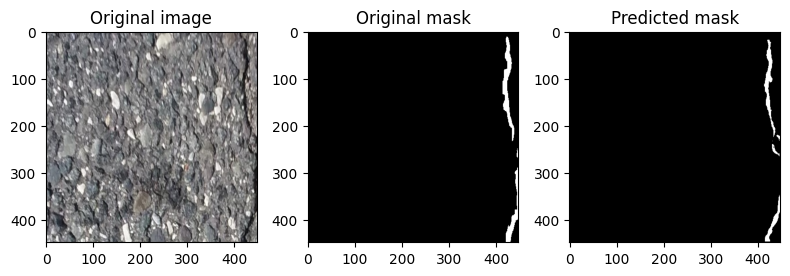

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


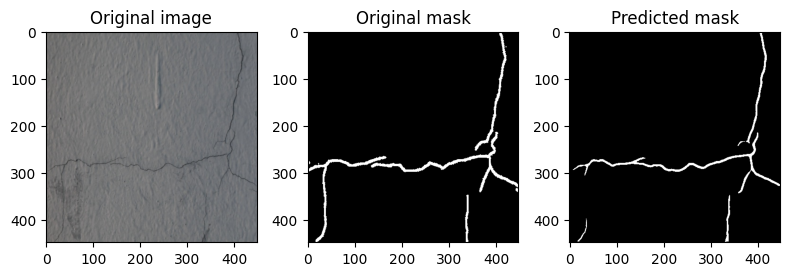

training_loss: 0.02005
training_iou: 0.56966
training_dice: 0.68651
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


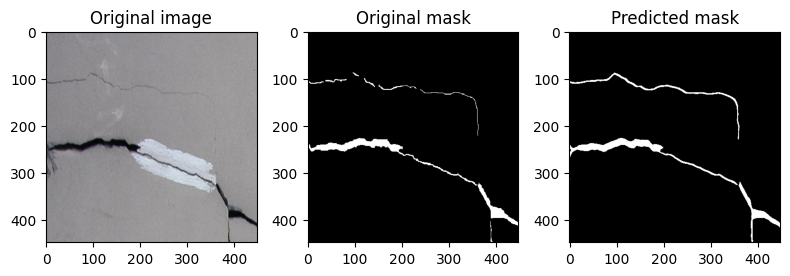

Epoch 12/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.01940693265432492
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


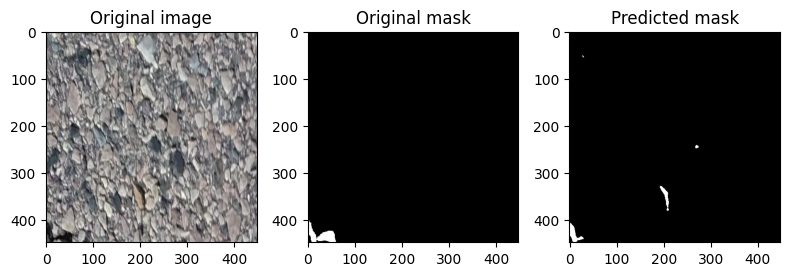

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


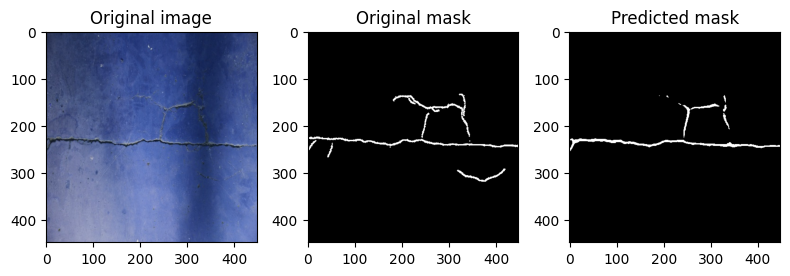

train_data visualize: loss:  0.019078462275210768
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


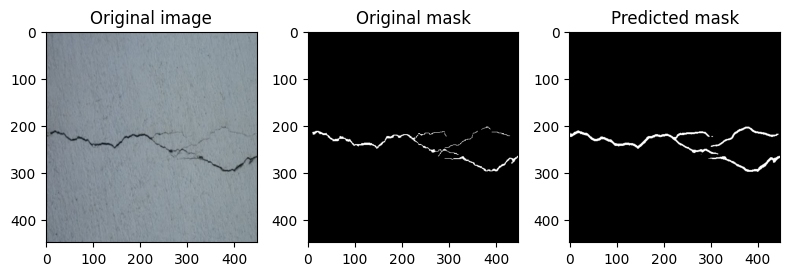

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


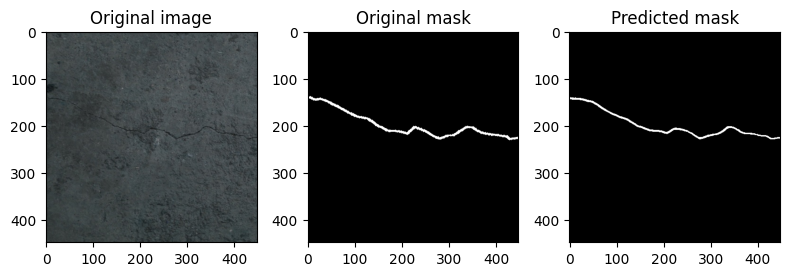

training_loss: 0.01935
training_iou: 0.57730
training_dice: 0.69676
Validation loss: 0.0195
Validation iou: 0.5811
Validation dice: 0.6951
Model saved to: seg_model.pth
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


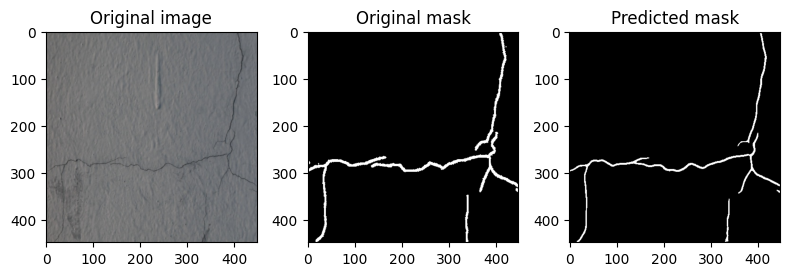

Epoch 13/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.019389509216416627
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


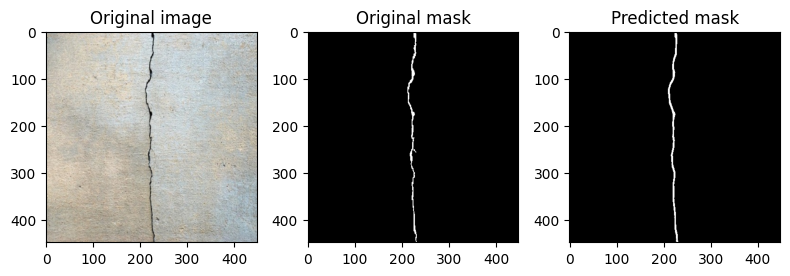

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


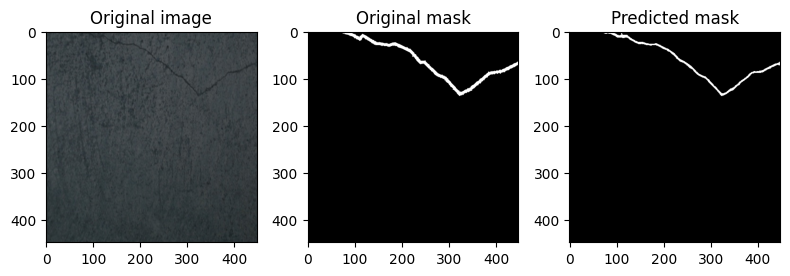

train_data visualize: loss:  0.01880546043161303
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


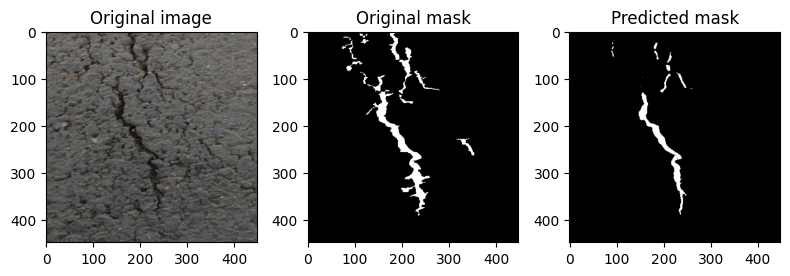

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


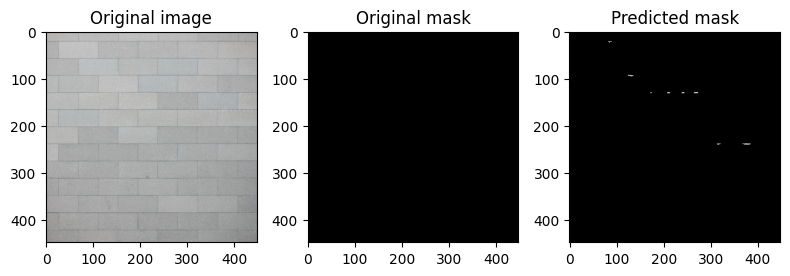

training_loss: 0.01909
training_iou: 0.59385
training_dice: 0.71066
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


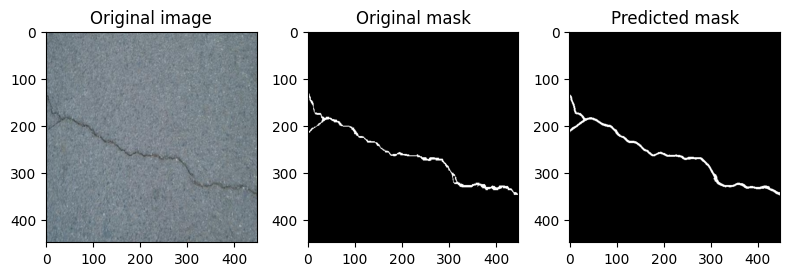

Epoch 14/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.018808591450564564
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


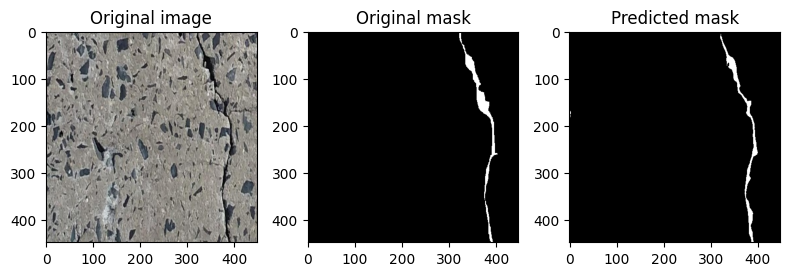

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


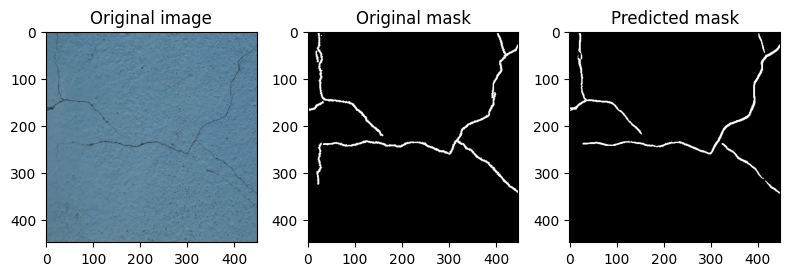

train_data visualize: loss:  0.017834576522931456
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


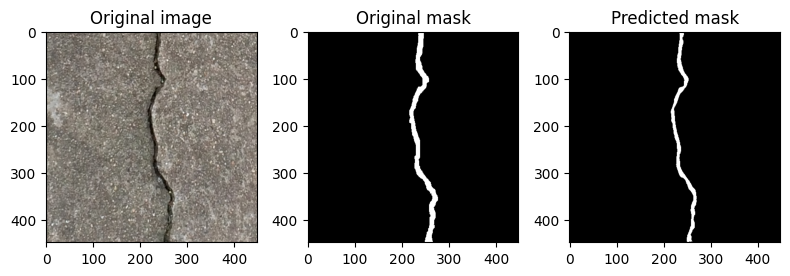

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


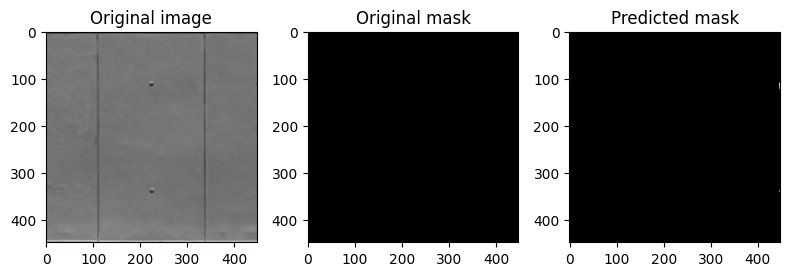

training_loss: 0.01866
training_iou: 0.59400
training_dice: 0.71035
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


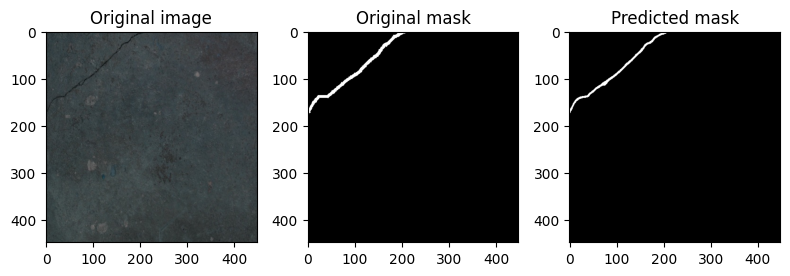

Epoch 15/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.017893916401546448
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


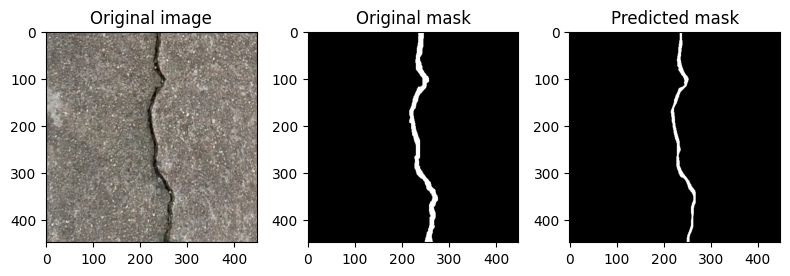

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


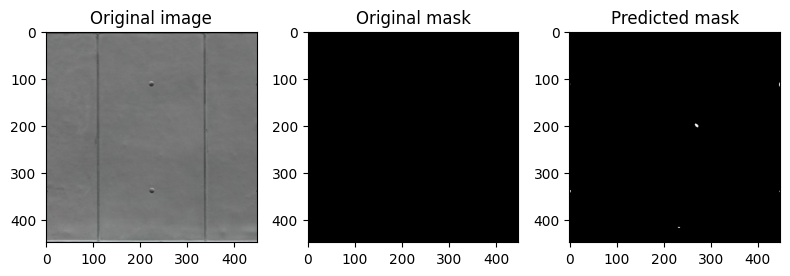

train_data visualize: loss:  0.018376301263459027
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


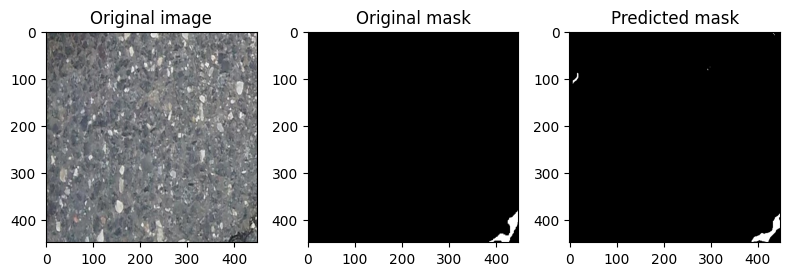

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


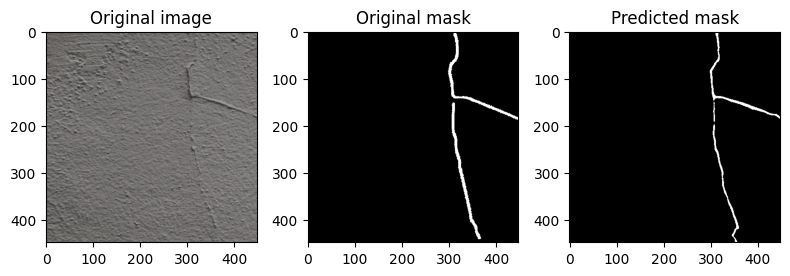

training_loss: 0.01810
training_iou: 0.60070
training_dice: 0.71707
Validation loss: 0.0197
Validation iou: 0.5738
Validation dice: 0.6863
INFO: Early stopping counter 1 of 5
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


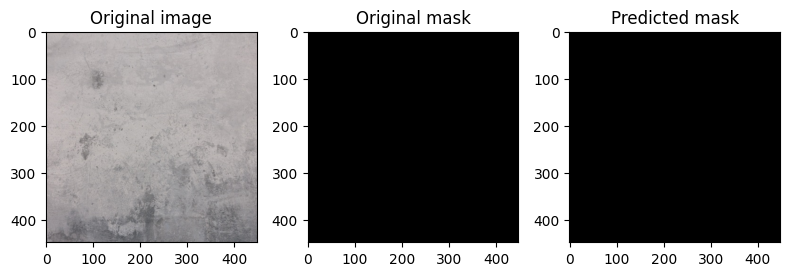

Epoch 16/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.017515510060824455
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


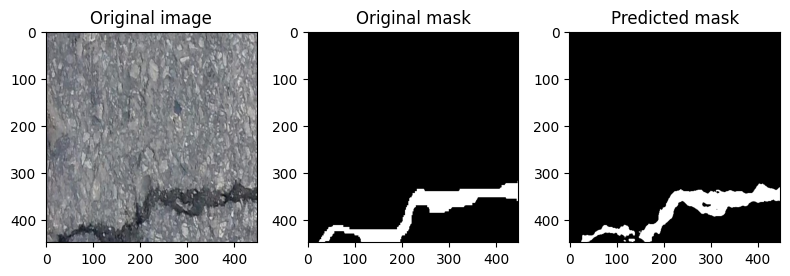

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


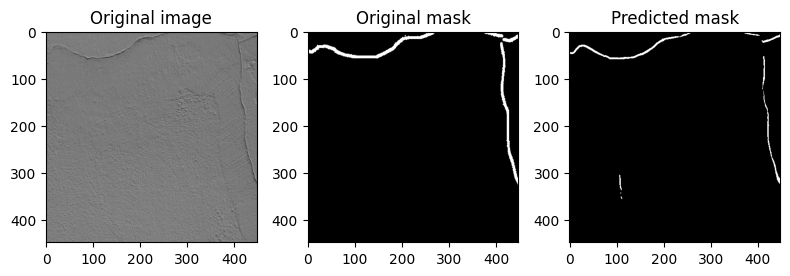

train_data visualize: loss:  0.017766699702013285
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


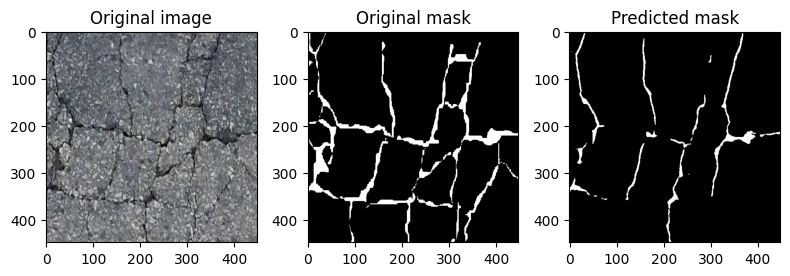

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


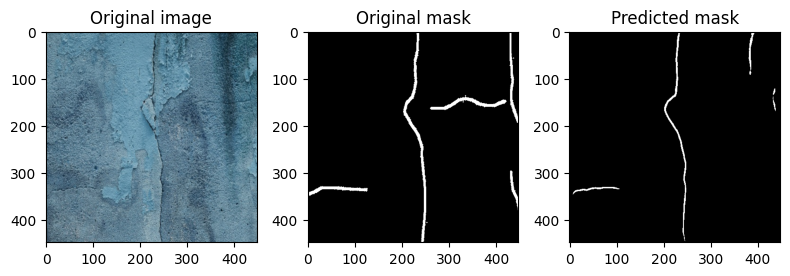

training_loss: 0.01758
training_iou: 0.61542
training_dice: 0.72748
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


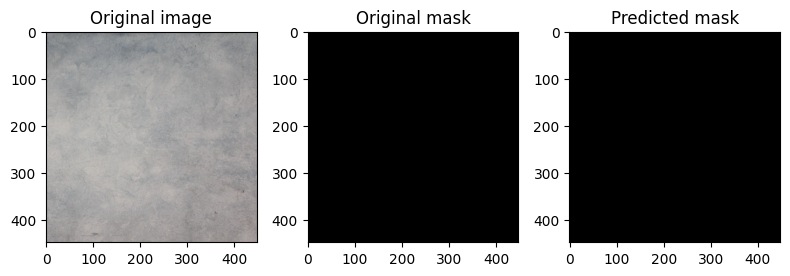

Epoch 17/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.016746786365751175
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


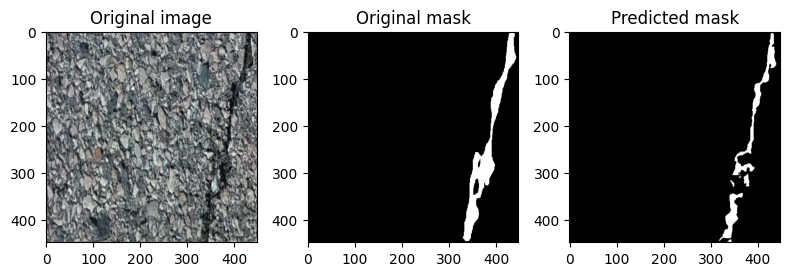

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


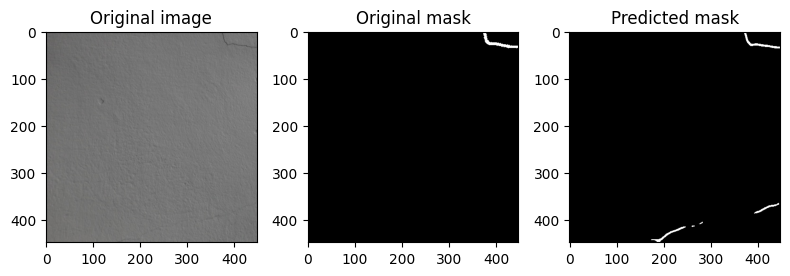

train_data visualize: loss:  0.017115834021475165
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


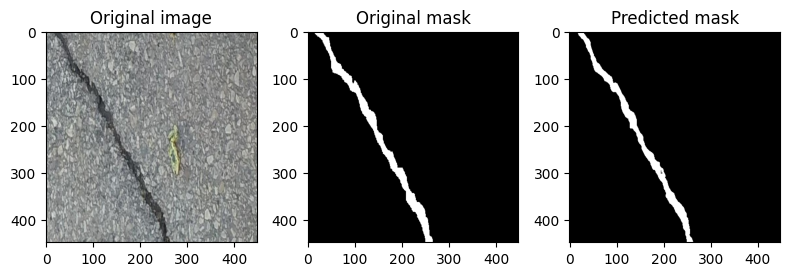

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


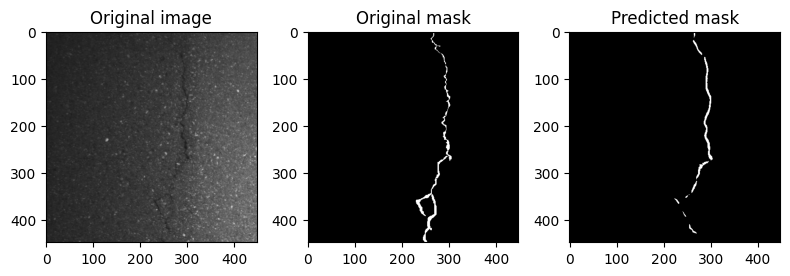

training_loss: 0.01688
training_iou: 0.60645
training_dice: 0.72152
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


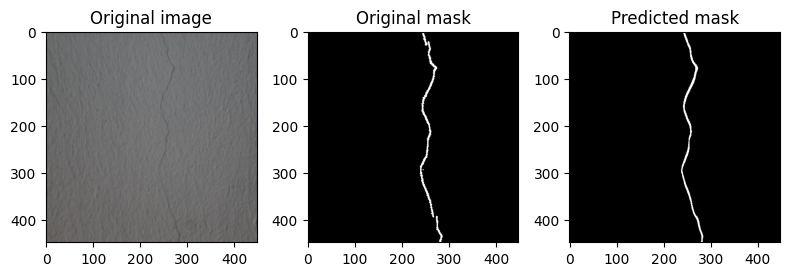

Epoch 18/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.017114297746680676
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


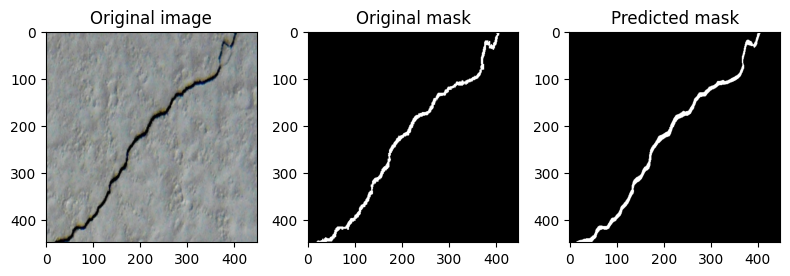

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


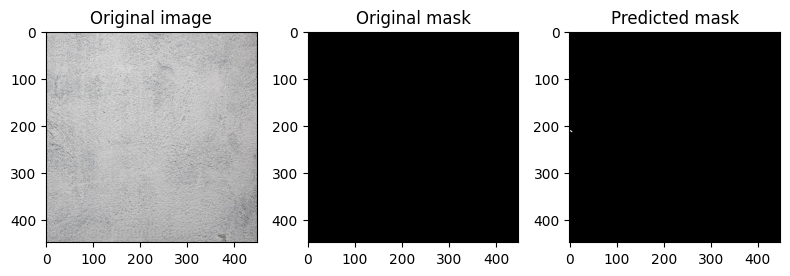

train_data visualize: loss:  0.018038326126523316
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


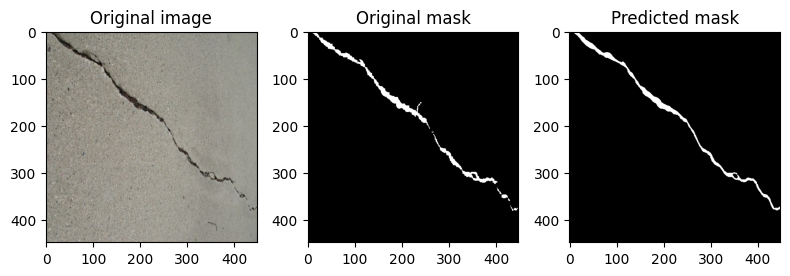

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


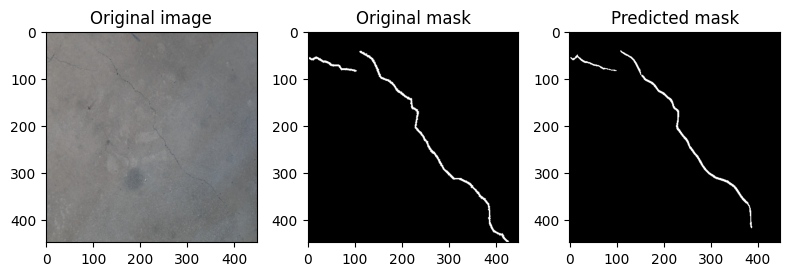

training_loss: 0.01736
training_iou: 0.60591
training_dice: 0.72034
Validation loss: 0.0178
Validation iou: 0.6208
Validation dice: 0.7344
Model saved to: seg_model.pth
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


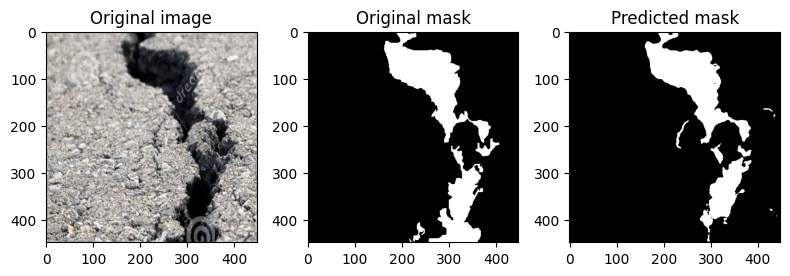

Epoch 19/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.015449741922086105
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


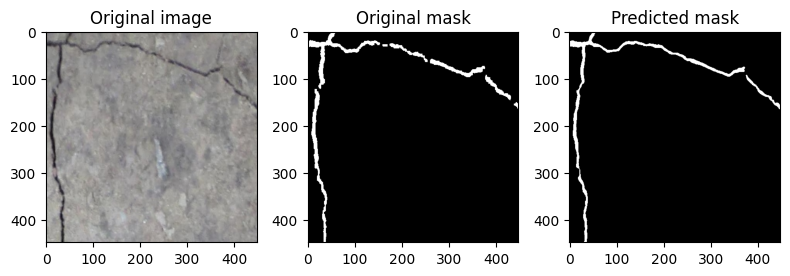

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


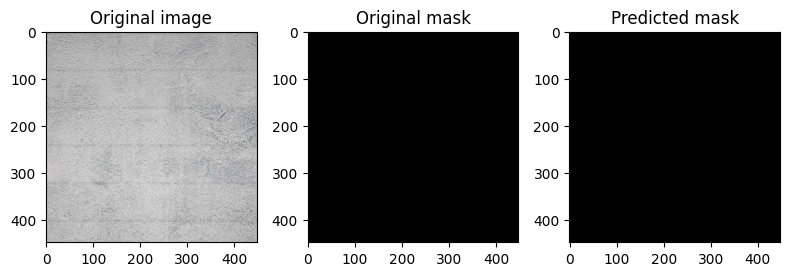

train_data visualize: loss:  0.0169032066706568
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


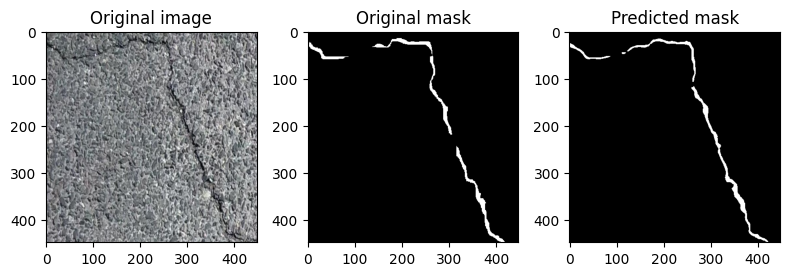

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


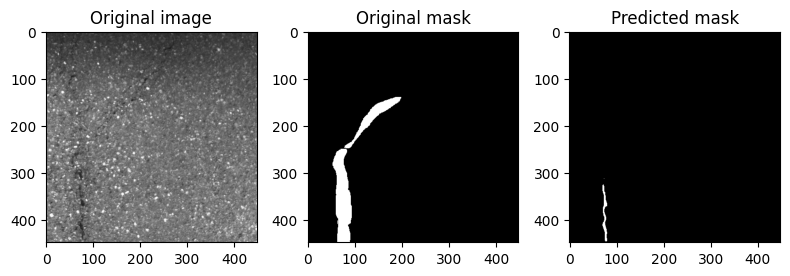

training_loss: 0.01620
training_iou: 0.63767
training_dice: 0.75029
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


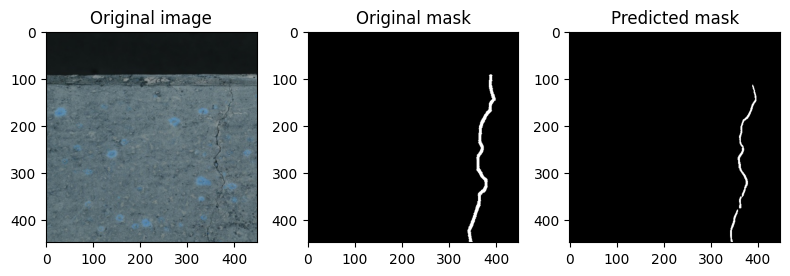

Epoch 20/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.015425436765421182
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


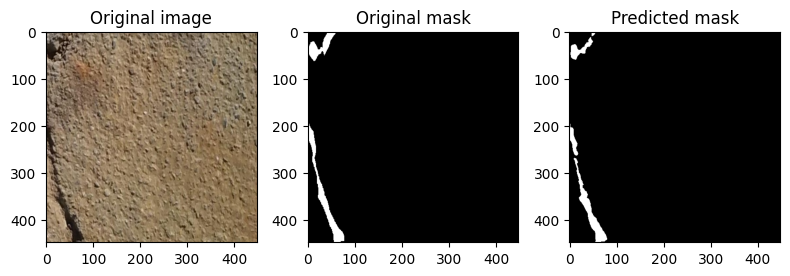

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


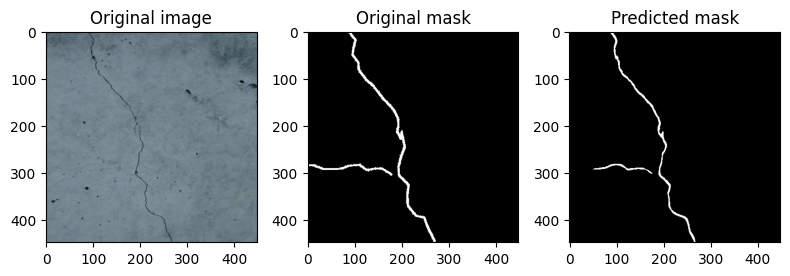

train_data visualize: loss:  0.016681237831246108
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


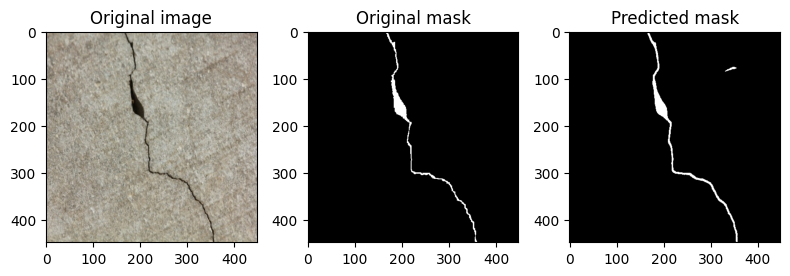

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


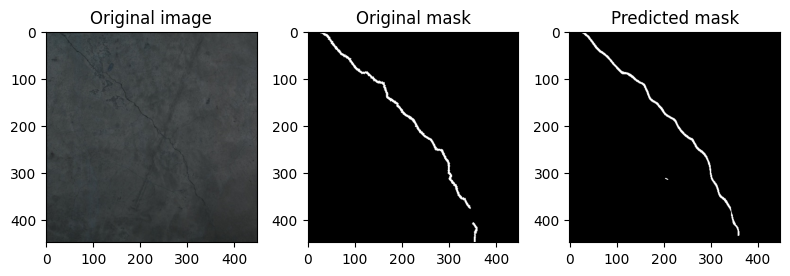

training_loss: 0.01611
training_iou: 0.65119
training_dice: 0.76047
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


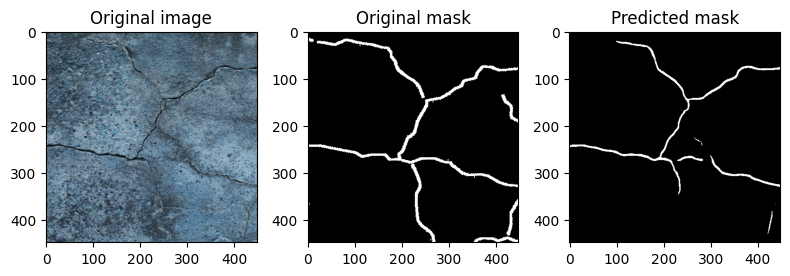

In [305]:
model=model.to(device)
# criterion= torchvision.ops.sigmoid_focal_loss
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # if unfreeze=True -> 1e-4, 1e-5, so not to ruin good init w
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
early = EarlyStopping()


# Loss function and optimizer
criterion = nn.BCEWithLogitsLoss()


# Define dictionaries to store per-epoch average loss and metrics
training_metrics = {
    'loss': [],
    'dice': [],
    'iou': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
}

validation_metrics = {
    'loss': [],
    'dice': [],
    'iou': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
}

# Training loop
for epoch in range(epochs):
    
    model.train()
    running_loss = 0.0
    running_500_loss=0.0
    epoch_loss = 0.0
    training_metrics_epoch = {
        'loss': [],
        'dice': [],
        'iou': [],
        'precision': [],
        'recall': [],
        'f1_score': [],
    }
    print(f'Epoch {epoch + 1}/{epochs}')
    for batch_idx, (inputs, targets) in enumerate(tqdm(train_dataloader, leave=False)):
        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        epoch_loss += loss.item()
        running_500_loss+=loss.item()

        # Calculate metrics for training after every 10th batch
        if (batch_idx +1 )% 500 == 0:
            
            random_number = np.random.randint(1, len(df_valid) + 1)
            
            print("train_data visualize: loss: ",running_500_loss/500)
            validate_test_image(model, df_train,random_number)
            print("valid_data visualize: ")
            validate_test_image(model, df_valid,random_number)
            running_500_loss=0.0
        if (batch_idx + 1) % 5 == 0:
            avg_loss = running_loss / 5  # Average loss for the last 10 batches
            running_loss = 0.0  # Reset the running loss

            # Calculate and store training metrics using find_metrics
            metrics = find_metrics(outputs, targets)  # Adjust threshold if needed
            training_metrics_epoch['loss'].append(avg_loss)
            training_metrics_epoch['dice'].append(metrics['dice'].cpu().item())
            training_metrics_epoch['iou'].append(metrics['iou'].cpu().item())
            training_metrics_epoch['precision'].append(metrics['precision'].cpu().item())
            training_metrics_epoch['recall'].append(metrics['recall'].cpu().item())
            training_metrics_epoch['f1_score'].append(metrics['f1_score'].cpu().item())
            
            

        
            

    # Calculate the average metrics for this epoch's training batches
    for key, value in training_metrics_epoch.items():
        if value:
            training_metrics[key].append(np.mean(value))
    
    # Calculate and store the average loss for this epoch
    training_metrics['loss'].append(epoch_loss / len(train_dataloader))
    print(f"training_loss: {epoch_loss / len(train_dataloader):.5f}")
    print(f"training_iou: {training_metrics['iou'][-1]:.5f}")
    print(f"training_dice: {training_metrics['dice'][-1]:.5f}")
    # Calculate validation metrics every 5 epochs
    avg_loss=0.0
    if (epoch + 1) % 3 == 0:
        model.eval()
        validation_loss = 0.0
        validation_metrics_epoch = {
            'loss': [],
            'dice': [],
            'iou': [],
            'precision': [],
            'recall': [],
            'f1_score': [],
        }

        for val_inputs, val_targets in valid_dataloader:
            val_inputs = val_inputs.to(device)
            val_targets = val_targets.to(device)

            val_outputs = model(val_inputs)
            val_loss = criterion(val_outputs, val_targets)
            validation_loss += val_loss.item()

            # Calculate and store validation metrics using find_metrics
            val_metrics = find_metrics(val_outputs, val_targets)  # Adjust threshold if needed
            validation_metrics_epoch['loss'].append(val_loss.item())
            validation_metrics_epoch['dice'].append(val_metrics['dice'].cpu().item())
            validation_metrics_epoch['iou'].append(val_metrics['iou'].cpu().item())
            validation_metrics_epoch['precision'].append(val_metrics['precision'].cpu().item())
            validation_metrics_epoch['recall'].append(val_metrics['recall'].cpu().item())
            validation_metrics_epoch['f1_score'].append(val_metrics['f1_score'].cpu().item())
            

           

        avg_validation_loss = validation_loss / len(valid_dataloader)
        avg_loss=avg_validation_loss


        # Calculate the average metrics for this epoch's validation batches
        for key, value in validation_metrics_epoch.items():
            if value:
                validation_metrics[key].append(np.mean(value))

        # Store the average loss for this epoch
        validation_metrics['loss'].append(avg_validation_loss)
        print(f'Validation loss: {avg_validation_loss:.4f}')
        print(f'Validation iou: {validation_metrics["iou"][-1]:.4f}')
        print(f'Validation dice: {validation_metrics["dice"][-1]:.4f}')
        scheduler.step(avg_loss)
        early(avg_loss, model=model)
#         if early.early_stop:
#             print(f'Validation loss did not improve for {early.patience} epochs. Training stopped.')
#             model.load_state_dict(torch.load(path))
#             break
        #         print("training_loss",validaion_metrics['loss'][epoch])
#         print("validation_iou",validation_metrics['iou'][epoch])
#         print("validation_dice",validation_metrics['dice'][epoch])

    if (epoch + 1) % 1 == 0:
        
            validate_test_image(model, df_valid)

    if (epoch + 1) == 3:
    # Define the path where you want to save the model
        model_path = "seg_model_"+str(epoch+1)+".pth"

        # Save the model's state_dict
        torch.save(model.state_dict(), model_path)

        print(f'Model saved after 3 epochs to {model_path}')
    torch.cuda.empty_cache()   

# Scheduler step (if using a learning rate scheduler)
 # Step based on the last validation loss


In [ ]:
len(valid_dataloader)

In [310]:
model_path_new='best_model_unet_20.pth'

In [311]:
torch.save(model.state_dict(),model_path_new )

In [317]:
def save_model(epochs, model, optimizer, criterion):
    """
    Function to save the trained model to disk.
    """
    print(f"Saving final model...")
    torch.save({
                'epoch': epochs,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': criterion,
                }, 'model_unet_20_opt_model_epoch.pth')

In [315]:
criterion,optimizer,epochs

(BCEWithLogitsLoss(),
 Adam (
 Parameter Group 0
     amsgrad: False
     betas: (0.9, 0.999)
     capturable: False
     differentiable: False
     eps: 1e-08
     foreach: None
     fused: None
     lr: 0.0001
     maximize: False
     weight_decay: 0
 ),
 20)

In [318]:
save_model(epochs, model, optimizer, criterion)

Saving final model...


In [ ]:
os.listdir('/kaggle/working/')

In [ ]:
import torch

allocated_memory = torch.cuda.memory_allocated()
cached_memory = torch.cuda.memory_cached()

print(f'Allocated GPU memory: {allocated_memory / (1024**2):.2f} MB')
print(f'Cached GPU memory: {cached_memory / (1024**2):.2f} MB')



In [ ]:
torch.cuda.empty_cache()

In [ ]:
print(training_metrics)

In [ ]:
print(validation_metrics)

In [ ]:
# masks=test[1]
# threshold=0.6
# outputs_pred = torch.sigmoid(output[0])
# y_pred = (outputs_pred > threshold).float()

# intersection = torch.logical_and(y_pred, masks)
# union = torch.logical_or(y_pred, masks)

# iou1= (torch.sum(intersection)+1e-15) / (torch.sum(union) + 1e-15)
# dice1 = (2 * torch.sum(intersection)+1e-15)/ (torch.sum(y_pred) + torch.sum(masks) + 1e-15)
# # precision1 = (torch.sum(intersection)+1e-15) / (torch.sum(y_pred) + 1e-15)
# # recall1 = (torch.sum(intersection)+1e-5) / (torch.sum(masks) + 1e-15)
# precision1=precision_tesnor(y_pred,masks)
# recall1=recall_tensor(y_pred,masks)
# f11 = (2 * precision1* recall1) / (precision1 + recall1)

In [ ]:
metrics=None
model=model.to(device)
for i in train_dataloader:
    model.eval()
    inputs,masks=i
    inputs=inputs.to(device)
    masks=masks.to(device)
    outputs=model(inputs)
    metrics=find_metrics(outputs,masks)
    break
    
# model = model.to(device)



In [ ]:
metrics['dice'].cpu().item()

In [ ]:
# outputs=None
# predicted=None
# for _, batch in enumerate(tqdm(train_dataloader, leave=False)):
#             model.eval()
#             inputs = batch[0]
#             targets = batch[1]

#             outputs = model(inputs)
#             _, predicted = torch.max(outputs, 1)
#             break

In [ ]:
outputs.shape

In [ ]:
predicted.shape

In [ ]:
accuracy_score(y_true,y_pred)

In [ ]:
torch.save()

In [307]:
print(validation_metrics)

{'loss': [0.027594913117354736, 0.027594913117354736, 0.022196926869103333, 0.022196926869103333, 0.01994343479747107, 0.01994343479747107, 0.01951031538219558, 0.01951031538219558, 0.019663203298333244, 0.019663203298333244, 0.017766129659737735, 0.017766129659737735], 'dice': [0.5810642566908943, 0.6746887700112111, 0.677186062673584, 0.6950521001783987, 0.6862869388725034, 0.7343861675677608], 'iou': [0.4716552437288311, 0.5621292432917824, 0.5681786553331, 0.5811362020310538, 0.5738045672390295, 0.6207969050428167], 'precision': [0.3053962394659725, 0.4110703619639505, 0.4061769963252539, 0.4242841581860615, 0.4418049578680031, 0.48751618131179714], 'recall': [0.6230463139082661, 0.6036876169454992, 0.6194206001746714, 0.6276839329902806, 0.6332283108981688, 0.6289983368038539], 'f1_score': [nan, nan, nan, nan, nan, nan]}


In [308]:
print(training_metrics)

{'loss': [0.04224783000876991, 0.04220806354242558, 0.029939727625256866, 0.02992272189010975, 0.02666945912481505, 0.026665477158861573, 0.025413145682948633, 0.025432020780334078, 0.02435420905580608, 0.024360003671760055, 0.022867919978254086, 0.022869173633524326, 0.022823640919949224, 0.022819214797572703, 0.02183397802281973, 0.021823485200096818, 0.02117794931116627, 0.021174593428724336, 0.020482485277608525, 0.020553573651175775, 0.02004453882696183, 0.020048799590425347, 0.01935818375133705, 0.019349210895975907, 0.01909894568909989, 0.019090772457700526, 0.01867806013007232, 0.01866423356416333, 0.018112517448853914, 0.01810399809846195, 0.01758953785557845, 0.017582624246004982, 0.016876031226115074, 0.016880911928578886, 0.017358534079711368, 0.017362758897504976, 0.016211309352022696, 0.016200762633185126, 0.01611097606553931, 0.01611029866469764], 'dice': [0.5155738848375111, 0.5973126530283834, 0.6265822880999828, 0.6330672501306224, 0.6475224832936031, 0.66066382068201

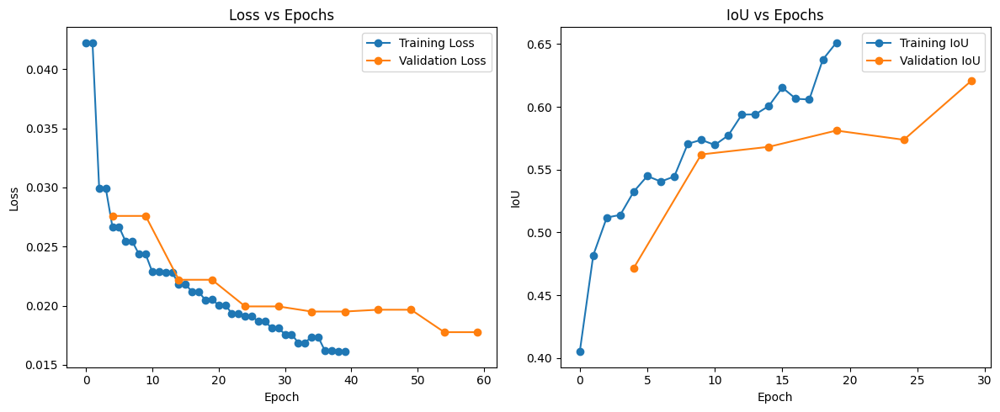

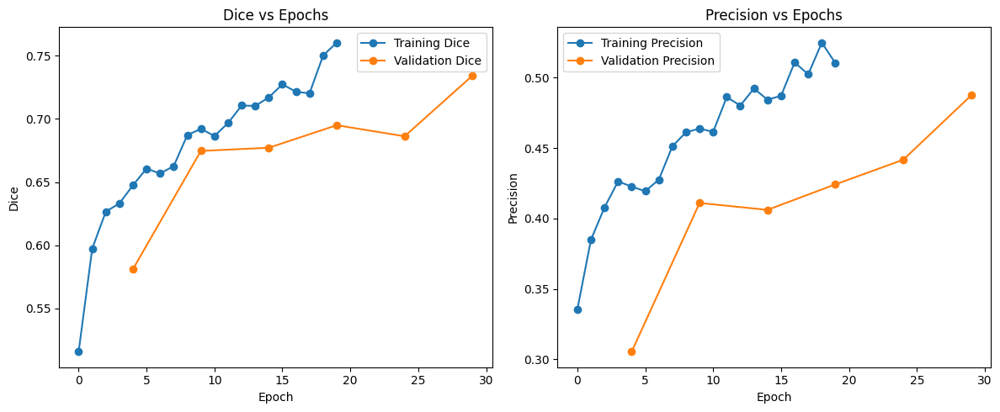

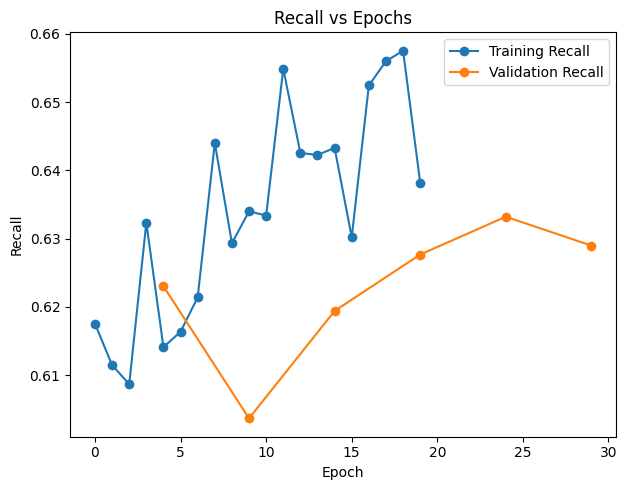

In [309]:
import matplotlib.pyplot as plt

# Assuming you have stored your metrics as dictionaries
# training_metrics and validation_metrics

# Extract the metrics
train_loss = training_metrics['loss']
train_iou = training_metrics['iou']
train_dice = training_metrics['dice']
train_precision = training_metrics['precision']
train_recall = training_metrics['recall']

val_loss = validation_metrics['loss']
val_iou = validation_metrics['iou']
val_dice = validation_metrics['dice']
val_precision = validation_metrics['precision']
val_recall = validation_metrics['recall']

# Create plots for Loss vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_loss)), train_loss, label='Training Loss', marker='o')
plt.plot(range(4, len(val_loss) * 5, 5), val_loss, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epochs')
plt.legend()

# Create plots for IoU vs Epochs
plt.subplot(1, 2, 2)
plt.plot(range(len(train_iou)), train_iou, label='Training IoU', marker='o')
plt.plot(range(4, len(val_iou) * 5, 5), val_iou, label='Validation IoU', marker='o')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.title('IoU vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()

# Create plots for Dice vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_dice)), train_dice, label='Training Dice', marker='o')
plt.plot(range(4, len(val_dice) * 5, 5), val_dice, label='Validation Dice', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.title('Dice vs Epochs')
plt.legend()

# Create plots for Precision vs Epochs
plt.subplot(1, 2, 2)
plt.plot(range(len(train_precision)), train_precision, label='Training Precision', marker='o')
plt.plot(range(4, len(val_precision) * 5, 5), val_precision, label='Validation Precision', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.title('Precision vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()

# Create plots for Recall vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_recall)), train_recall, label='Training Recall', marker='o')
plt.plot(range(4, len(val_recall) * 5, 5), val_recall, label='Validation Recall', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.title('Recall vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()


In [320]:
model2 = UNET()
model2.load_state_dict(torch.load('/kaggle/working/best_model_unet_20.pth'))
# model.eval()

<All keys matched successfully>

shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


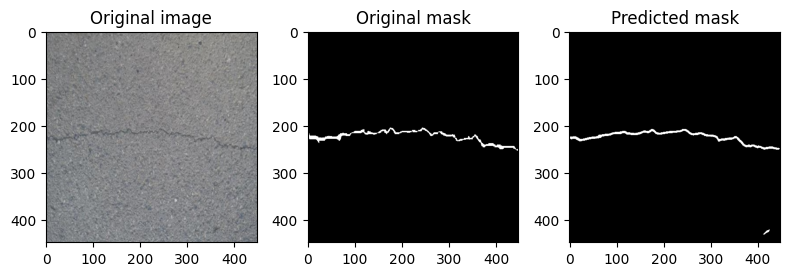

In [323]:
model2=model2.to(device)
validate_test_image(model2,df_valid)